# Purpose
This notebook is designed to break down the data in a systematic way, and allow us to replicably train/compare models

# Imports
Import key libraries

In [1]:
!pip install --upgrade seaborn pandas -q

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ydata-profiling 4.12.0 requires scipy<1.14,>=1.4.1, but you have scipy 1.14.1 which is incompatible.


In [2]:
# Imports

# Documentation
from typing import Optional, Tuple, Callable, Literal, List

# Environment setup/interaction
from kaggle_secrets import UserSecretsClient
import logging
import sys
import warnings

# Data manipulation/vis
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
from matplotlib import pyplot as plt
import json

# Statistical calculations
from scipy.special import loggamma
import math

# Guardrails
from functools import wraps
from itertools import combinations

# Initial setup
Define values we will need to reuse across our analysis

## Variables

In [3]:
# Global variables

RANDOM_SEED: int = 42
TARGET_COLUMN: str = "efs"
COLUMNS_UNIQUE_TO_TEST_DATA = ["efs", "efs_time"]

ID_COLUMN: str = "ID"

TRAIN_DATA_LOC: str = "/kaggle/input/equity-post-HCT-survival-predictions/train.csv"
TEST_DATA_LOC: str = "/kaggle/input/equity-post-HCT-survival-predictions/test.csv"


TRAIN_VAL_TEST_RATIO = (0.7, 0.3, 0.0) # Leave test ratio as 0 because have it supplied

In [4]:
# Weights and biases setup

WEIGHTS_AND_BIASES_KEY: Optional[str] = None
try:
    user_secrets = UserSecretsClient()
    WEIGHTS_AND_BIASES_KEY = user_secrets.get_secret("W_AND_B_KEY")
except:
    logger.error("Error getting weights and biases key, will skip wandb integration")

## Functions

# Establish classes
Create classes for running code

## Data Loading and Manipulation

In [5]:
# Data loading class

class DataLoading():
    """
    Class to load and store our data.

    The very first thing it does is establish our train, validation, and test
    sets. This is because doing EDA/ feature generation can cause data leakage.
    
    """
    random_seed: int = 0
    train_data: pd.DataFrame = pd.DataFrame()
    validation_data: pd.DataFrame = pd.DataFrame()
    test_data: pd.DataFrame = pd.DataFrame()

    def __init__(
        self, 
        random_seed: int,
        id_col: str,
        target_col: str,
        train_data: str|pd.DataFrame,
        validation_data: str|pd.DataFrame|None = None,
        test_data: str|pd.DataFrame|None = None,
        train_val_test_ratio: Tuple[float, float, float] = (0.7, 0.3, 0.0),
        max_unique_values: int = 10,
        difference_tolerance: float = 0.1
    ):
        """
        Initialisation function which takes either the location of the data
        or the already-extracted data. If the location of the data it extracts
        it. If validation_data or test_data are not given then it will split
        using the given random seed.

        Args:
            - random_seed (int): random seed to use in all random operations
                                for reproducibility
            - train_data (str|pd.DataFrame): either a pandas DataFrame or the
                                path to a csv
            - validation_data (str|pd.DataFrame): either a pandas DataFrame or the
                                path to a csv. Optional - if None will be generated
                                with split
            - test_data (str|pd.DataFrame): either a pandas DataFrame or the
                                path to a csv. Optional - if None will be generated
                                with split
            - train_val_test_ratio (Tuple[float, float, float]): three numbers which
                                define how the data should be split if needed. 
                                Must always equal 1 even if not used.
            - max_unique_values (int): Argument to pass to a function that checks whether
                                    the training and validation sets have roughly similar
                                    proportions of values for our target variable. max_unique_values
                                    determines when we shouldn't run these additional parity checks
                                    (i.e. it doesn't make sense to try to achieve parity when
                                    predicting continuous variables).
                                    Default: 10
            - difference_tolerance (float): Max allowed proportional difference between
                                        training and validation distribution. I.e. if
                                        the tolerance is set to 0.1, if the training 
                                        data has 60% True values in the target column, 
                                        and the validation data has 70%, no error will
                                        be triggered, but it will be triggered on 60% 
                                        and 71%.
                                        Default: 0.1
        """

        self.train_data = self.load_data(train_data)

        train_val_ratio = 1


        # Confirm crossbleed check working
        try:
            self.check_for_crossbleed(
            df_1 = self.train_data,
            df_2 = self.train_data,
            id_col = id_col,
            df_names = ("train_data", "train_data")
            )
        except ValueError:
            pass  # Passes because the error was raised
        else:
            raise AssertionError("Expected error was not raised - crossbleed check may not be working")

        if test_data is not None:
            self.test_data = self.load_data(data = test_data)
        else:
            test_ratio = train_val_test_ratio[2]
            train_val_ratio = 1-test_ratio
            
            self.train_data, self.test_data = self.split_data(
                data = self.train_data,
                splits = (train_val_ratio, test_ratio),
                random_seed = random_seed
            )

        self.check_for_crossbleed(
            df_1 = self.train_data,
            df_2 = self.test_data,
            id_col = id_col,
            df_names = ("train_data", "test_data")
        )



        if validation_data is not None:
            self.validation_data = self.load_data(data = validation_data)
        else:
            train_ratio = train_val_test_ratio[0]/train_val_ratio
            val_ratio = train_val_test_ratio[1]/train_val_ratio
            self.train_data, self.validation_data = self.split_data(
                data = self.train_data,
                splits = (train_ratio, val_ratio),
                random_seed = random_seed
            )
            
        self.check_for_crossbleed(
            df_1 = self.train_data,
            df_2 = self.validation_data,
            id_col = id_col,
            df_names = ("train_data", "validation_data")
        )


        self.data_distributions = calculate_train_valid_col_splits(
            train_data = self.train_data,
            valid_data = self.validation_data,
            col = target_col,
            max_unique_values = max_unique_values,
            difference_tolerance = difference_tolerance
        )
        

        print(f"""
        Train data: {self.train_data.shape}
        Validation data: {self.validation_data.shape}
        Test data: {self.test_data.shape}
        """)
        
            
    @staticmethod
    def load_data(data: str|pd.DataFrame) -> pd.DataFrame:
        """
        Function to load and return data if passed a string.
        Otherwise just return data - this is for DRY consistency.

        TODO: add ways to modify how the data is loaded.

        Args:
            - (str|pd.DataFrame): either a pandas DataFrame or the
                                path to a csv

        Returns:
            - pd.DataFrame: loaded file

        Raises:
            - Any loading errors from Pandas
            - Error if filepath is not csv
            - Error if "data" type is not dataframe or string
        """

        if type(data) == pd.DataFrame:
            return data

        if type(data) != str:
            raise ValueError(f"Data must be either dataframe or string, yours is: {type(data)}")

        if not ".csv" in data:
            raise ValueError(f"Expecting a csv file path, but got {data}")

        loaded_data = pd.read_csv(data)
        
        print(f"Loaded: {data} shape: {loaded_data.shape}")

        return loaded_data
        
    @staticmethod
    def split_data(
        data: pd.DataFrame, 
        splits: Tuple[float, float],
        random_seed: int
    ) -> Tuple[pd.DataFrame, pd.DataFrame]:
        """
        Function to split data into portions based on defined ratios.

        Args:
            - data (pd.DataFrame): data to be split
            - splits (Tuple[float, float]): ratio over which to split it,
                                    first returned dataset will be size
                                    of first ratio, must equal 1
            - random_seed (int): random seed for consistency

        Returns:
            - pd.DataFrame: df of size of first item in tuple
            - pd.DataFrame: df of size of second item in tuple
            
        
        """

        # Make sure splitting will always include all data
        if sum(splits)!=1:
            raise ValueError(f"Split must equal 1, your split is {splits}")
            
        # Make sure there's enough data to split
        if len(data) < 2:
            raise ValueError("Data too small to split.")

        # Shuffle data
        data_shuffled = data.sample(
            frac=1, 
            random_state=random_seed
        ).reset_index(drop=True)

        # Calculate rows to include in each split
        portion_one_rows = int(splits[0]*len(data_shuffled))
        df_1 = data_shuffled.iloc[:portion_one_rows]
        df_2 = data_shuffled.iloc[portion_one_rows:]

        return df_1, df_2

    @staticmethod
    def check_for_crossbleed(
        df_1: pd.DataFrame, 
        df_2: pd.DataFrame, 
        id_col: str,
        df_names: Tuple[str, str]
        ):
        """
        A function to check whether any records from one set have found their way into another

        Args:
            - df_2 (pd.DataFrame): first dataset to check
            - df_2 (pd.DataFrame): second dataset to check
            - id_col (str): name of unique identifier column we can use to check for crossbleed
        """

        # Check if any value in df1['column1'] exists in df2['column2']
        overlap = sum(df_1[id_col].isin(df_2[id_col]))
        if overlap >0:
            raise ValueError(f"Error, {overlap} rows in {df_names[0]} also appear in {df_names[1]}")

        

    @property
    def datasets(self):
        return {
            "train": self.train_data,
            "validation": self.validation_data,
            "test": self.test_data
        }

    






In [6]:
# Functions for checking training and validation splits, separated to decouple and allow easier testing.

def calculate_train_valid_col_splits(
    train_data: pd.DataFrame, 
    valid_data: pd.DataFrame,
    col: str,
    max_unique_values: int = 10,
    difference_tolerance: float = 0.1
    ) -> dict[str, dict[str, dict[str, float]]]:
    """
    Function to calculate the proportions of target col values in the
    training and validation data, check that those proportions are roughly
    in-line and return the result.

    This only works when trying to predict a set list of categorical values
    so has a simple automatic return to skip parity checks and avoid annoying errors on 
    load.

    Args:
        - train_data (pd.DataFrame): The data we'll be training on
        - valid_data (pd.DataFrame): The data we'll be validating against
        - col (str): The column we want to check proportional split of
        - max_unique_values (int): Don't run additional checks if the total number
                                    of unique values to predict is greater than this
                                    Default: 10
        - difference_tolerance (float): Max allowed proportional difference between
                                    training and validation distribution. I.e. if
                                    the tolerance is set to 0.1, if the training 
                                    data has 60% True values in the target column, 
                                    and the validation data has 70%, no error will
                                    be triggered, but it will be triggered on 60% 
                                    and 71%.
                                    Default: 0.1
    Returns:
        dict[str, dict[str, dict[str, float]]]: Dictionary with keys of train/validation
                                inside those keys is a dictionary containing
                                the count and proportional split figures
    """

    train_stats = calculate_target_col_split(data = train_data, col = col)
    valid_stats = calculate_target_col_split(data = valid_data, col = col)

    output_dict = {
        "train": train_stats,
        "validation": valid_stats
    }

    unique_vals = len(train_stats["count"].keys())

    if unique_vals >max_unique_values:
        print(f"""
Large number of potential predicted values: {unique_vals}.

So not trying to check for parity between train and validation sets distribution""")
        return output_dict

    # Check that the same values appear in both
    train_values = train_stats["proportion"].keys()
    validation_values = valid_stats["proportion"].keys()

    diff = set(train_values).difference(set(validation_values))
    if len(diff)>0:
        raise ValueError(f"""
Error: your training data and validation data need to have similar target values.

This is the list of target variables that appeared in one but not the other:

{diff}
""")
    

    for key, value in train_stats["proportion"].items():
        validation_proportion = valid_stats["proportion"][key]
        if abs(validation_proportion-value)>difference_tolerance:
            raise ValueError(f"""
Your training set and validation set have different proportions for {key}.

It appears in your training set: {int(value*100)}% of the time.
It appears in your validation set: {int(validation_proportion*100)}% of the time.
""")

    return output_dict

    


def calculate_target_col_split(data: pd.DataFrame, col: str) -> dict[str, dict[str, float]]:
        """
        Function that calculates the proportional split in different values in the target
        column, can be used to inform statistical tests later, or to highlight an unequal split
        in the training and validation sets.

        Args:
            - data (pd.DataFrame): Data to check
            
        Returns:
            dict[str, dict[str, dict[str, float]]]: Dictionary with keys of 'count'/'proportion'
                                    inside those keys are the count and proportional split figures
            
        """
        total_count = len(data)

        working_df = data[[col]].copy()
        working_df["count"] = 1

        col_split = working_df.groupby(col).count()
        col_split["proportion"] = col_split["count"]/total_count

        return col_split.to_dict()

## Probability Calculation Functions
Functions that help us calculate some statistical aspects of our features, for example - for a given sub-category, what is the likelihood of getting as many positive outcomes as we do, given the overall positive/negative split

In [7]:
def analyze_feature_significance(
    df: pd.DataFrame,
    target_col: str,
    total_positive_rate: float,
    feature_cols: Optional[List[str]] = None,
    positive_value: any = True,
    max_unique_values: int = 15
) -> pd.DataFrame:
    """
    Analyze each feature's relationship with a target variable by calculating
    the probability of observed co-occurrences happening by chance.
    
    Parameters:
        df: Input DataFrame
        target_col: Name of the target column (containing positive/negative outcomes)
        total_positive_rate: Pre-calculated proportion of positive values
        feature_cols: List of feature columns to analyze. If None, uses all columns except target
        positive_value: The value in target_col that represents a positive outcome
        max_unique_values: Skip columns with more unique values than this (default 15)
        
    Returns:
        DataFrame with hierarchical index (feature, value) showing probabilities
        and related statistics for each feature value's correlation with target
    """
    
    if feature_cols is None:
        feature_cols = [col for col in df.columns if col != target_col]
    
    feature_cols = [
        col for col in feature_cols 
        if len(df[col].unique()) <= max_unique_values
    ]
    
    results = []
    
    for feature in feature_cols:
        unique_values = df[feature].unique()
        
        for value in unique_values:
            subset = df[df[feature] == value]
            
            group_size = len(subset)
            positives_in_group = sum(subset[target_col] == positive_value)
            
            if group_size < 10:
                continue
            
            # Calculate log probability first
            log_prob = calculate_log_probability(
                set_size=group_size,
                size_in_positive_group=positives_in_group,
                probability=total_positive_rate
            )
            
            # Convert to regular probability only if it's not too extreme
            if log_prob > -30:  # threshold chosen to avoid underflow
                prob = math.exp(log_prob)
            else:
                prob = 0.0  # effectively zero
            
            results.append({
                'feature': feature,
                'value': value,
                'group_size': group_size,
                'positives': positives_in_group,
                'positive_rate': positives_in_group / group_size,
                'difference_from_expected': (positives_in_group / group_size) - total_positive_rate,
                'expected_positives': group_size * total_positive_rate,
                'log_probability': log_prob,
                'probability': prob,
            })
    
    # Convert to DataFrame and sort by log probability instead
    results_df = pd.DataFrame(results)
    results_df = results_df.set_index(['feature', 'value']).sort_values('log_probability')
    
    return results_df

def calculate_log_probability(
    set_size: int, 
    size_in_positive_group: int, 
    probability: float
) -> float:
    """
    Calculate the log probability that a group would be split in the way we're seeing.
    Returns the natural logarithm of the probability.
    """
    n = set_size
    k = size_in_positive_group
    p = probability

    # Calculate in log space to avoid numerical issues
    log_binom_coeff = loggamma(n + 1) - loggamma(k + 1) - loggamma(n - k + 1)
    log_probability = log_binom_coeff + k * math.log(p) + (n - k) * math.log(1 - p)

    return log_probability

## Data Manipulation Functions

You might be wondering: why are we using a decorator here rather than just having the functions stand alone, and then using a class to make sure they are applied to all three datasets? This way, when we create a function we can dictate that it should only be used across all of our data. 

While there are ways of marking functions as internal-only, this way as soon as we look at a function, we can see that based on the decorator it is meant to be applied across all of our datasets.

In [8]:
# Multi-apply decorator and checker functions

def multi_apply_decorator(function: Callable) -> Callable:
    """
    Decorator to make sure that when we are doing someething to 
    one dataset, we do the same to the others
    """
    @wraps(function)
    def wrapper(
        train_data: pd.DataFrame,
        validation_data: pd.DataFrame|None,
        test_data: pd.DataFrame,
        columns_not_to_check: list[str],
        *args,
        **kwargs,
    ) -> Tuple[pd.DataFrame, pd.DataFrame, pd.DataFrame]:
        """
        Wrapper that forces us to always pass train_data, validation_data, and test_data
        and makes sure that we're applying the same changes to each dataset.

        *Use with care if interpolating/averaging data* - in streaming setups we
        may still need to generate rolling averages, but in most cases you should
        calculate the average based on the training set and then apply to all with
        this.

        Args:
            - train_data (pd.DataFrame): training data, should be source of any averages
            - validation_data (Optional[pd.DataFrame]): validation data, should only apply changes/ combine
                                            existing columns. If this isn't supplied a duplicate
                                            of the training data will be returned in its place
            - test_data (pd.DataFrame): test data, should only apply changes/ combine
                                            existing columns
            - columns_not_to_check (list[str]): optional override for column parity/dtype check
                                            removing columns that we don't think should be checked
            - *args **kwargs: standard arguments for function we're calling

        Returns:
            - pd.DataFrame: modified training_data
            - pd.DataFrame: modified validation_data
            - pd.DataFrame: modified test_data
        """
        # Run transformation on all datasets
        train_data = function(data = train_data, *args, **kwargs)
        
        if validation_data is None:
            validation_data = train_data
        else:
            validation_data = function(data = validation_data, *args, **kwargs)
            
        test_data = function(test_data, *args, **kwargs)



        # Check that the datasets all have matching columns and data
        confirm_matching_data(
            dataframes_dict = {
            "train_data": train_data,
            "validation_data": validation_data,
            "test_data": test_data,
            },
            columns_not_to_check = columns_not_to_check)

        return train_data, validation_data, test_data
    return wrapper

def confirm_matching_cols(
    cols1: list[str], 
    name1: str,
    cols2: list[str],
    name2: str
    ):
    """
    Check two lists, raise errors if there are any values in
    one list that doesn't appear in the other

    Args:
        - cols1 (list[str]): first list to check
        - name1 (str): friendly name to print
        - cols2 (list[str]): second list to check
        - name2 (str): friendly name to print
    
    """
    col_1_mismatch = [c for c in cols1 if c not in cols2]
    col_2_mismatch = [c for c in cols2 if c not in cols1]

    if len(col_1_mismatch) > 0 or len(col_2_mismatch) > 0:
        raise ValueError(f"""Mismatch between {name1} and {name2} columns:
        
Colums in {name1} but not {name2}
{col_1_mismatch}

Columns in {name2} but not {name1}
{col_2_mismatch}
""")


def confirm_matching_dtypes(
    df1: pd.DataFrame,
    name1: str, 
    df2: pd.DataFrame,
    name2: str, 
    columns_not_to_check: list[str]
    ):
    """
    Function to check that the dtypes in two sets of data match.

    Args:
        - df1 (pd.DataFrame): first dataset to check
        - name1 (str): print-friendly name
        - df2 (pd.DataFrame): second dataset to check
        - name2 (str): print-friendly name
        - target_col (str): target column which won't appear in all datasets
    
    """
    for _c in df1.columns:
        if _c in columns_not_to_check:
            continue

        dtype1 = df1[_c].dtype
        dtype2 = df2[_c].dtype
            
        # Special handling for category types
        if dtype1.name == 'category' and dtype2.name == 'category':
            if not (df1[_c].cat.categories.equals(df2[_c].cat.categories) and
                    df1[_c].cat.ordered == df2[_c].cat.ordered):
                raise ValueError(f"""Non-matching category details between sets:

{_c} has different categories or ordering in {name1} and {name2}""")
        elif dtype1 != dtype2:
            raise ValueError(f"""Non-matching dtypes between sets:

{_c} is {dtype1} in {name1} and {dtype2} in {name2}""")
    

def confirm_matching_data(
    dataframes_dict: dict[str, pd.DataFrame],
    columns_not_to_check: list[str]
    ):
    """
    Function that takes a dictionary of dataframes and throws an error if there is a 
    mismatch between their columns.

    Args:
        - dataframes_dict (dict[str, pd.Dataframe]): dictionary of items to check
        - columns_not_to_check (list[str]): list of columns not to bother checking
    """

    for (_key, _value), (_key2, _value2) in combinations(dataframes_dict.items(), 2):
        _cols1 = [_c for _c in _value.columns if not _c in columns_not_to_check]
        _cols2 = [_c for _c in _value2.columns if not _c in columns_not_to_check]

        confirm_matching_cols(
            cols1 = _cols1,
            name1 = _key,
            cols2 = _cols2,
            name2 = _key2
        )

        confirm_matching_dtypes(
            df1 = _value,
            name1 = _key, 
            df2 = _value2,
            name2 = _key2,
            columns_not_to_check = columns_not_to_check,
            )

In [9]:
# Concatenate column values

@multi_apply_decorator
def simple_column_concat(data: pd.DataFrame, column_list: list[str], output_name: str) -> pd.DataFrame:
    """
    Function that takes a list of columns and returns a new column which is just a simple concatenation
    of the values in the list
    
    Args:

        **Added by multi_apply_decorator**
        - train_data (pd.DataFrame): The training data to apply this change to
        - validation_data (pd.DataFrame): The validation data to apply this change to
        - test_data (pd.DataFrame): The test data to apply this change to
        - columns_not_to_check (list[str]): Columns to skip when checking for parity after making this change

        **Arguments for this function that are covered by the decorator**
        - data (pd.DataFrame): The dataframe to modify **this is covered by the decorator**
        
        **Standard arguments for this function not covered by the decorator arguments**
        - column_list (list[str]): List of column names
        - output_name (str): Name to give newly created column

    Returns:
        - pd.DataFrame: modified dataframe
    """

    working_df = data.copy()

    working_df[output_name] = working_df[column_list].astype(str).agg(' '.join, axis=1)

    return working_df

In [10]:
# summarise_checks

@multi_apply_decorator
def summarise_checks(
    data: pd.DataFrame, 
    column_list: list[str], 
    categories_to_check_for: list[str], 
    output_name: str,
    lowercase_cols: bool = False,
    fillna_val: str = "true n/a"
    ) -> pd.DataFrame:
    """
    Function that takes a list of columns and checks if any of those columns contain a certain string, if so
    returns that string in a new column, if none of the target strings match, then just returns concatenation
    of columns. The strings are checked for in order so ones at the start take precedence.
    
    Args:

        **Added by multi_apply_decorator**
        - train_data (pd.DataFrame): The training data to apply this change to
        - validation_data (pd.DataFrame): The validation data to apply this change to
        - test_data (pd.DataFrame): The test data to apply this change to
        - columns_not_to_check (list[str]): Columns to skip when checking for parity after making this change

        **Arguments for this function that are covered by the decorator**
        - data (pd.DataFrame): The dataframe to modify **this is covered by the decorator**
        
        **Standard arguments for this function not covered by the decorator arguments**
        - column_list (list[str]): List of column names
        - categories_to_check_for (list[str]): Ordered list of strings to check for, will check for each
                                in turn and when finding one - will return in the output column
        - output_name (str): Name to give newly created column
        - lowercase_cols (bool): Whether to convert values to lowercase before doing this check
                                Defaults to False
        - fillna_val (str): The value to replace null values with. 
                                Defaults to "true n/a"

    Returns:
        - pd.DataFrame: modified dataframe
    """

    def check_for_string(
        row: pd.Series, 
        column_list: list[str], 
        categories_to_check_for: list[str],
        ) -> str:
        """
        Internal function which checks columns for a list of strings and returns what's found.

        Args:
            - row (pd.Series): the row we're checking
            - column_list (list[str]): list of columns to check for matches
            - categories_to_check_for (list[str]): Ordered list of strings to check for, will check for each
                                in turn and when finding one - will return in the output column
        """
        for _k in categories_to_check_for:
            if any(row[col] == _k for col in column_list):
                return _k

        return ' / '.join(row[column_list].astype(str))

    input_df = data.copy()
    output_df = data.copy()

    if lowercase_cols:
        input_df[column_list] = input_df[column_list].fillna(fillna_val).astype(str).apply(lambda col: col.str.lower())

    output_df[output_name] = input_df.apply(lambda x: check_for_string(
        row=x, 
        column_list=column_list,
        categories_to_check_for=categories_to_check_for
    ), axis=1)

    return output_df

In [11]:
# split_column

@multi_apply_decorator
def split_column(
    data: pd.DataFrame, 
    target_col: str, 
    split_symbol: str, 
    output_columns: list[str] = []
) -> pd.DataFrame:
    """
    Function to split a column based on a symbol and create new columns from it.

    Args:

        **Added by multi_apply_decorator**
        - train_data (pd.DataFrame): The training data to apply this change to
        - validation_data (pd.DataFrame): The validation data to apply this change to
        - test_data (pd.DataFrame): The test data to apply this change to
        - columns_not_to_check (list[str]): Columns to skip when checking for parity after making this change

        **Arguments for this function that are covered by the decorator**
        - data (pd.DataFrame): The dataframe to modify **this is covered by the decorator**
        
        **Standard arguments for this function not covered by the decorator arguments**
        - target_col (str): Column to split
        - split_symbol (str): Symbol to split on
        - output_columns (list[str]): Names to give the output columns, if [] then they just take the default names
                                    Defaults to []

    Returns:
        - pd.DataFrame: modified dataframe
    """

    if type(output_columns)!=list:
        raise ValueError(f"{output_columns} is a {type(output_columns)} - it must be a list")

        
    if target_col not in data.columns:
        raise KeyError(f"{target_col} is not in {data.columns}")

    working_df = data.copy()

    # Split the target column into multiple columns based on the split_symbol
    split_data = working_df[target_col].str.split(split_symbol, expand=True)
    
    # Determine the number of output columns
    num_split_cols = split_data.shape[1]
    
    # If no output column names are provided, generate default names
    if not output_columns:
        output_columns = [f"{target_col}_part_{i}" for i in range(num_split_cols)]
    elif len(output_columns) != num_split_cols:
        raise ValueError(
            f"Number of output_columns ({len(output_columns)}) does not match the number of splits ({num_split_cols})."
        )
    
    # Assign split columns to the working dataframe
    for idx, col_name in enumerate(output_columns):
        working_df[col_name] = split_data[idx]
    
    # Drop the original column
    working_df.drop(columns=[target_col], inplace=True)
    
    return working_df

In [12]:
# check_identical_values

@multi_apply_decorator
def check_identical_values(
    data: pd.DataFrame, 
    target_cols: list[str], 
    output_column: str = ""
) -> pd.DataFrame:
    """
    Function to check if columns have identical values and output the result in a new column.

    Args:
        **Added by multi_apply_decorator**
        - train_data (pd.DataFrame): The training data to apply this change to
        - validation_data (pd.DataFrame): The validation data to apply this change to
        - test_data (pd.DataFrame): The test data to apply this change to
        - columns_not_to_check (list[str]): Columns to skip when checking for parity after making this change

        **Arguments for this function that are covered by the decorator**
        - data (pd.DataFrame): The dataframe to modify **this is covered by the decorator**

        **Standard arguments for this function not covered by the decorator arguments**
        - target_cols (list[str]): Columns to check - can have multiple columns but will check if *all* columns
                                   have identical values.
        - output_column (str): Name to give the output column. If "" will concatenate names of input cols.
                               Defaults to "".

    Returns:
        - pd.DataFrame: Modified dataframe with the new output column indicating if values in target columns are identical.
    """

    working_df = data.copy()
    
    # Validate input
    if not isinstance(target_cols, list):
        raise ValueError(f"`target_cols` must be a list, got {type(target_cols)}.")
    
    if len(target_cols) < 2:
        raise ValueError("At least two columns must be provided in `target_cols`.")

    for col in target_cols:
        if col not in data.columns:
            raise KeyError(f"Column '{col}' not found in the dataframe.")

    # Generate default output column name if none is provided
    if not output_column:
        output_column = "_and_".join(target_cols) + "_identical"

    # Check if all columns in `target_cols` have identical values
    working_df[output_column] = working_df[target_cols].nunique(axis=1) == 1

    return working_df

In [13]:
# generate_buckets and bucket_column

def generate_buckets(
    data: pd.DataFrame,
    target_col: str,
    bucket_size: int | float,
    force_raw: bool = False,
    include_outliers: bool = True
) -> np.ndarray:
    """
    Function for taking a column of continuous values and creating bins to use for binning that 
    column and similar columns in the validation and test data.

    Should only be used with training data.

    Args:
        - data (pd.DataFrame): The dataframe containing the column to bucket.
        - target_col (str): Column to bucket.
        - bucket_size (int|float): The size of the buckets to use. If between 0 and 1, it will
                                   be interpreted as percentile bucketing unless you also pass "force_raw=True".
                                   If above 1, it will be interpreted as the value interval to use.
        - force_raw (bool): Whether to treat decimal numbers as a raw bin size to use, rather than
                                    a percentile. Default: False
        - include_outliers (bool): Whether to extend the very outer bins so that they will incorporate
                                    extreme outliers. This can mean that extreme outliers aren't flagged
                                    in errors but it will also help with error handling and mean that
                                    you are bucketing outliers into a bucket *kind of like* them that
                                    the model has seen before
                                    default: True

    Returns:
        - np.ndarray: bins to use on our training, validation, and test data.
    """

    if bucket_size <= 0:
        raise ValueError("Bucket size must be greater than 0.")

    if bucket_size < 1 and not force_raw:  # Percentile bucketing
        # Define the quantiles based on the bucket size
        quantiles = np.arange(0, 1 + bucket_size, bucket_size)
        bins = np.quantile(data[target_col], quantiles)
    else:  # Value interval bucketing
        # Use `np.arange` to create fixed intervals
        min_val = data[target_col].min()
        max_val = data[target_col].max()
        bins = np.arange(min_val, max_val + bucket_size, bucket_size)

    if include_outliers:
        # Extend outer buckets to include outliers
        bins[0] = -np.inf  # Extend the first bucket downwards
        bins[-1] = np.inf  # Extend the last bucket upwards

    return bins



@multi_apply_decorator
def bucket_column(
    data: pd.DataFrame, 
    target_col: str, 
    output_name: str, 
    bins: int|float,
    replacement_for_outer_infinite: int|float = np.inf,
    threshold_to_take: Literal["upper","lower", "none"] = "none",
    ) -> pd.DataFrame:
    """
    Function for taking a column of continuous values and bucketing them.

    **IMPORTANT: ** You must pass your buckets as part of this function, run the generate_buckets function
    on your training data first, and then pass your buckets to this function so that all datasets
    are bucketed the same way.

    **ALSO IMPORTANT:** When generating your buckets - consider whether your validation and test data
    might have different upper/lower limits than your training data now or in the future. By default the
    binning function will include extreme outliers in the extreme upper and lower buckets, unless you
    switch that option off.
    
    Args:

        **Added by multi_apply_decorator**
        - train_data (pd.DataFrame): The training data to apply this change to
        - validation_data (pd.DataFrame): The validation data to apply this change to
        - test_data (pd.DataFrame): The test data to apply this change to
        - columns_not_to_check (list[str]): Columns to skip when checking for parity after making this change

        **Arguments for this function that are covered by the decorator**
        - data (pd.DataFrame): The dataframe to modify **this is covered by the decorator**
        
        **Standard arguments for this function not covered by the decorator arguments**
        - target_col (str): Column to bucket
        - output_name (str): Name to give newly created column, can be same as input col
        - bins (np.ndarray): An array of numbers to use for binning,
        - threshold_to_take (Literal["upper"|"lower"]): Whether to simplify the bins by taking the upper
                                                        or lower threshold as the value for the column,
                                                        if "none" then won't modify
        - replacement_for_outer_infinite (int|float): If simplifying the bucket values (see threshold_to_take)
                                                        what to replace the written value of the outer infinites
                                                        with, for easier processing. Bear in mind that infinite
                                                        values may be bucketed in to these outer buckets, this
                                                        is just the label for the bucket, so a poor choice of
                                                        label could make odd results harder to debug in future.
        

    Returns:
        - pd.DataFrame: modified dataframe
    """

    working_df = data.copy()

    
    working_df[output_name] = pd.cut(working_df[target_col], bins=bins, right=False).cat.as_ordered()

    if threshold_to_take == "none":
        return working_df



    
    if threshold_to_take == "lower":
        # Replace bucket labels with lower bounds
        new_categories = [
            x.left if pd.notna(x) else None
            for x in working_df[output_name].cat.categories
        ]
        new_categories = [
            replacement_for_outer_infinite if c == -np.inf else c for c in new_categories
        ]
        working_df[output_name] = working_df[output_name].cat.rename_categories(new_categories)
        
    elif threshold_to_take == "upper":
        # Replace bucket labels with lower bounds
        new_categories = [
            x.right if pd.notna(x) else None
            for x in working_df[output_name].cat.categories
        ]
        new_categories = [
            replacement_for_outer_infinite if c == np.inf else c for c in new_categories
        ]
        working_df[output_name] = working_df[output_name].cat.rename_categories(new_categories)


    return working_df

In [ ]:
# create_bool_col

@multi_apply_decorator
def create_bool_col()

## Data Visualisation

In [14]:
# Pretty print dictionary

def pretty_print_dict(data):
    """
    Pretty prints a dictionary.

    Args:
        data (dict): The dictionary to pretty print.

    Returns:
        None
    """
    print(json.dumps(data, indent=4, sort_keys=True))

In [15]:
# Data Visualisation class and functions

class DataVisualisation:
    """Handles visualization of datasets."""

    @staticmethod
    def plot_nas(data: pd.DataFrame):
        """
        Shows NA percentage for each column in the dataframe.

        Arguments:
            - data (pd.DataFrame): Data to plot NA percentages for.
        """

        # Calculate percentage of NaN values for each column and sort descending
        na_counts = data.isna().mean().reset_index()
        na_counts.columns = ['Column', 'NA Percentage']
        na_counts = na_counts.sort_values(by='NA Percentage', ascending=False)

        print(na_counts)

        # Create the bar chart
        plt.figure(figsize=(12, 8))  # Increased figure size for better x-axis spacing
        sns.barplot(x='Column', y='NA Percentage', data=na_counts)
        plt.title('Percentage of NaN Records per Column')
        plt.xlabel('Columns')
        plt.ylabel('NA Percentage (%)')
        plt.xticks(rotation=45, ha='right')  # Rotate and align x-axis labels
        plt.gca().xaxis.labelpad = 15  # Add extra padding between the x-axis labels and the axis
        plt.tight_layout()  # Ensures the layout fits the figure
        plt.show()
      
    @staticmethod
    def plot_distribution(
        data: pd.DataFrame, 
        column: str, 
        group_column: str = None,
        ax: matplotlib.axes.Axes = None,
        na_replacement_continuous: int|float = np.nan,
        na_replacement_discrete: str = "True N/A",
        show_values: bool = True
    ) -> None:

        
        """
        Takes data and a column to plot, and plots a histogram of that column.
        If a group_column is specified, it plots data for each group with different colors.

        The function automatically detects whether the column in question is categorical or continuous
        and uses that to decide whether to plot a line chart or bar chart. Importantly - bar charts
        are ordered just based on high-to-low density whereas line charts for continuous variables
        are ordered based on low-to-high column value.
    
        Args:
            - data (pd.DataFrame): Source data.
            - column (str): Column to plot histogram for.
            - group_column (str, optional): Column to group data by.
            - ax (matplotlib.axes.Axes, optional): Axis to plot on (for grid). Defaults to None.
            - na_replacement_continuous (int|np.nan): What to replace continuous na values with before visualising
            - na_replacement_discrete (str): What to replace discrete na values with before visualising
            - show_values (bool): Whether to show values above bars in bar charts. Defaults to True.

        Returns:
            None
        """
        if column not in data:
            raise ValueError(f"Column '{column}' not found in data.")
        if group_column and group_column not in data:
            raise ValueError(f"Group column '{group_column}' not found in data.")
    
        # Prepare data for plotting (without modifying original DataFrame)
        working_data = data[[column, group_column] if group_column else [column]].copy()
    
        column_data = working_data[column]
        if column_data.dtype == 'object' or isinstance(column_data.dtype, pd.CategoricalDtype):
            # For categorical: Order by volume
            try:
                if working_data[column].isna().sum() > 0:
                    working_data[column] = working_data[column].fillna(na_replacement_discrete)
            except Exception as e:
                # True categorical columns will often object to a hasty fillna
                warnings.warn(f"Error filling na for {column}: {e}")
            category_counts = working_data[column].value_counts()
            ordered_categories = category_counts.index

            _kwargs = dict(
                    x=column,
                    data=working_data,
                    order=ordered_categories,
                    ax=ax
            )

            title = f"Histogram of {column} (Ordered by Volume)"
            if group_column:
                # Set the color palette based on unique group values, in a consistent order
                unique_groups = sorted(working_data[group_column].dropna().unique())
                palette = sns.color_palette("husl", len(unique_groups))  # Or any other palette
                group_palette = dict(zip(unique_groups, palette))
                _kwargs["hue"] = group_column
                _kwargs["palette"] = group_palette
                title = f"Histogram of {column} by {group_column} (Ordered by Volume)"
                    
                sns.countplot(**_kwargs)
                
                if show_values:
                    # Calculate counts and percentages within each category
                    category_group_counts = working_data.groupby([column, group_column]).size().unstack(fill_value=0)
                    category_totals = category_group_counts.sum(axis=1)
                    
                    # Track the x-position for bars
                    bar_positions = {cat: idx for idx, cat in enumerate(ordered_categories)}
                    bar_width = 0.8 / len(unique_groups)  # Default bar width in seaborn
                    
                    # Find maximum bar height for setting y-axis limit
                    max_height = 0
                    
                    # Annotate each bar
                    for cat in ordered_categories:
                        cat_total = category_totals[cat]
                        base_x = bar_positions[cat]
                        
                        for group_idx, group in enumerate(unique_groups):
                            count = category_group_counts.loc[cat, group]
                            percentage = (count / cat_total * 100) if cat_total > 0 else 0
                            
                            # Calculate center of the bar
                            bar_center = base_x - 0.4 + (group_idx + 0.5) * bar_width
                            
                            # Find the height of this specific bar
                            for p in ax.patches:
                                if abs(p.get_x() - (base_x - 0.4 + group_idx * bar_width)) < 0.01 and abs(p.get_height() - count) < 0.01:
                                    height = p.get_height()
                                    max_height = max(max_height, height)
                                    ax.annotate(
                                        f"{int(count)}\n({percentage:.1f}%)",
                                        (bar_center, height),
                                        ha="center",
                                        va="bottom",
                                        xytext=(0, 5),
                                        textcoords="offset points"
                                    )
                                    break
                    
                    # Add 15% padding to the top of the plot
                    if max_height > 0:
                        ax.set_ylim(0, max_height * 1.15)
            else:
                # For ungrouped data, simply plot the counts
                sns.countplot(**_kwargs)
                title = f"Histogram of {column} (Ordered by Volume)"
                if show_values:
                    total = len(working_data)
                    counts = working_data[column].value_counts()
                    for cat, p in zip(ordered_categories, ax.patches):
                        count = counts[cat]
                        proportion = count / total
                        ax.annotate(
                            f"{count}\n({proportion:.1%})",
                            (p.get_x() + p.get_width() / 2., p.get_height()),
                            ha='center',
                            va='center',
                            xytext=(0, 5),
                            textcoords='offset points'
                        )
                            
        else:
            # For continuous: Plot histogram
            column_data = column_data.replace([np.inf, -np.inf], na_replacement_continuous).replace(np.nan, na_replacement_continuous)
            column_data = column_data.dropna()
            print(f"{column} - {sum(column_data==na_replacement_continuous)}")
            if not group_column:
                sns.histplot(
                    column_data,
                    bins=30,
                    kde=True,
                    ax=ax
                )
                title = f"Histogram of {column} (Ordered by Value)"

            
            else:
                # Set the color palette based on unique group values, in a consistent order
                unique_groups = sorted(working_data[group_column].dropna().unique())
                palette = sns.color_palette("husl", len(unique_groups))  # Or any other palette
                group_palette = dict(zip(unique_groups, palette))
                
                for group in unique_groups:
                    sns.histplot(
                        column_data[working_data[group_column] == group],
                        bins=30,
                        kde=True,
                        label=group,
                        ax=ax,
                        stat="density",
                        element="poly",
                        fill=False,
                        alpha=0.3,
                        linewidth=1.5,
                        color=group_palette[group]
                    )
                title = f"Histogram of {column} by {group_column} (Ordered by Value)"
                if ax:
                    ax.legend(title=group_column)
                else:
                    plt.legend(title=group_column)

    
        if ax:
            ax.set_title(title)
            if column_data.dtype == 'object' or isinstance(column_data.dtype, pd.CategoricalDtype):
                for label in ax.get_xticklabels():
                    label.set_rotation(90)
        else:
            plt.title(title)
            if column_data.dtype == 'object' or isinstance(column_data.dtype, pd.CategoricalDtype):
                plt.xticks(rotation=90)
            plt.show()

    @staticmethod
    def plot_violin_charts(
        data: pd.DataFrame, 
        column: str, 
        group_by_column: str, 
        ax: matplotlib.axes.Axes = None
    ):
        """
        Takes data and two columns to plot a violin chart of the first column,
        split by the two unique values in the second column. Handles both
        continuous and discrete data.
    
        Args:
            - data (pd.DataFrame): source data
            - column (str): column to plot violin chart for
            - group_by_column (str): column with two unique values to split data
            - ax (matplotlib.axes.Axes, optional): Axis to plot on (for grid). 
                                                   Defaults to None.
        """
        if column not in data:
            raise ValueError(f"Column '{column}' not found in data.")
        if group_by_column not in data:
            raise ValueError(f"Group-by column '{group_by_column}' not found in data.")
    
        # Ensure group_by_column has exactly two unique values
        unique_values = data[group_by_column].dropna().unique()
        if len(unique_values) != 2:
            raise ValueError(
                f"Group-by column '{group_by_column}' must have exactly two unique values."
            )
    
        # Determine if the column is categorical or continuous
        column_data = data[column]
        is_categorical = column_data.dtype == 'object' or isinstance(column_data.dtype, pd.CategoricalDtype)
    
        # Prepare data for plotting
        working_data = data[[column, group_by_column]].copy()
        
        # Determine if the column is categorical or continuous
        if column_data.dtype == 'object' or isinstance(column_data.dtype, pd.CategoricalDtype):
            # For categorical: Order by volume
            working_data[column] = working_data[column].fillna("True N/A")
            sns.violinplot(
                data = working_data,
                x = group_by_column,
                y = column,
                ax = ax,
                split = True
            )
            title = f"Distribution of {column} by {group_by_column} (Categorical Data)"
        else:
            # For continuous: Plot violin
            # Don't replace na with 0 because that could clash with real 0s
            column_data = data[column].replace([np.inf, -np.inf], np.nan).dropna()
            # Treat as continuous data
            sns.violinplot(
                data=working_data,
                x=group_by_column,
                y=column,
                ax=ax,
                split = True
            )
            title = f"Distribution of {column} by {group_by_column} (Continuous Data)"            
    
        if ax:
            ax.set_title(title)
        else:
            plt.title(title)
            plt.show()
    

        
    @staticmethod
    def plot_correlation_matrix(
        data: pd.DataFrame,
        columns: list[str],
        ax: plt.Axes = None,
        cmap: str = "coolwarm",
        annot: bool = True,
        fmt: str = ".2f"
    ) -> None:
        """
        Plots a correlation matrix for a subset of columns in a DataFrame.

        Args:
            - data (pd.DataFrame): Source data.
            - columns (list[str]): List of column names to include in the correlation matrix.
            - ax (plt.Axes, optional): Axis to plot on (for grids). Defaults to None.
            - cmap (str): Color map for the heatmap. Defaults to 'coolwarm'.
            - annot (bool): Whether to annotate the heatmap cells with correlation values. Defaults to True.
            - fmt (str): String formatting for annotations. Defaults to '.2f'.

        Returns:
            None
        """
        if not all(column in data for column in columns):
            missing_columns = [column for column in columns if column not in data]
            raise ValueError(f"Columns {missing_columns} not found in data.")
        
        # Compute correlation matrix
        correlation_matrix = data[columns].corr()
        
        # Create heatmap
        sns.heatmap(
            correlation_matrix,
            ax=ax,
            cmap=cmap,
            annot=annot,
            fmt=fmt,
            square=True,
            cbar_kws={"shrink": 0.8}
        )

        # Add title if ax is provided
        if ax:
            ax.set_title("Correlation Matrix")
        else:
            plt.title("Correlation Matrix")
            plt.show()

    
    @staticmethod
    def plot_grid(
        data: pd.DataFrame, 
        plotting_function: Callable|None = None,
        columns: list[str]|None = None, 
        columns_to_skip: list[str] = [],
        figsize: tuple[int] =(15, 10), 
        n_cols: int = 3,
        split_col: str|None = None,
        **kwargs
        ):
        """
        Create a grid of charts for the given columns in the dataset.

        Args:
            data (pd.DataFrame): Data to plot
            potting_function (Callable|None): The plotting function to call for each chart
            columns (list or None): List of column names to plot. If None, all columns are used.
            columns_to_skip (list): List of column names to skip. 
                                    If empty list, no columns are skipped.
                                    Defaults to []
            figsize (tuple): Size of the entire figure (width, height).
            n_cols (int): Number of plots per row.
            split_col (Optional[str]): The column to create additional splits for
                                        In general it's a good idea for n_cols to 
                                        be 1+len(split_col.unique())
            kwargs (Optional): Any extra arguments we need to pass to the visualisation function
        """
        if columns is None:
            columns = data.columns

        columns = [c for c in columns if c not in columns_to_skip]

        columns = sorted(columns)

        n_rows = -(-len(columns) // n_cols)  # Ceiling division for rows

        fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
        axes = axes.flatten()

        for i, column in enumerate(columns):
            plotting_function(data = data,
                              column = column, 
                              ax=axes[i],
                              **kwargs)  # Call standalone function

        # Remove empty subplots
        for j in range(len(columns), len(axes)):
            fig.delaxes(axes[j])

        plt.tight_layout()
        plt.show()

    @staticmethod
    def summarise_by_split(
        df: pd.DataFrame, 
        col_to_summarise: str, 
    
        palette: list, 
        hue_column: str = "1", 
        continuous: bool = True, 
        cat_plot_col: str = None,
        cat_plot_row: str = None,
        drop_nulls: bool = False,
        as_percent: bool = True,
        sort_col: str = None) -> None:
        
        """
        
        Function to take a dataframe, and a target column, 
        and show the frequency of each value in the column.
        
        
        arguments:
            - df (DataFrame): Pyspark dataframe to visualise
            - col_to_summarise (str): Name of column we want to split
            - hue_column (str - optional):  [default "1"] Name of the column to further split by,
                                        each version to be a different colour. If
                                        not present in dataframe or not defined we
                                        just won't split by this column
            - continuous (bool - optional): [default True] If the data is continuous plot as a line chart, otherwise
                                a bar chart
            - cat_plot_col (str - optional): [default None] Another column to split by, but this time create a 
                                separate chart for each split, show next to each other
                                on one line
            - cat_plot_row(str - optional): [default None] Another column to split by, but this time create a 
                                separate chart for each split, show one after another, each
                                split on a new line
            - drop_nulls (bool - optional): [default False] whether or not to remove nulls before vis
            - as_percent (bool - optional): [default True] whether to show the hue breakdown as a percentage of
                                the col_to_summarise breakdown, or if everything should be raw numbers
            - sort_col (str - optional): [default None] column to sort data by, so charts are consistently ordered                    
            
        """
        
    #     If we're dropping nulls then drop'em
        if drop_nulls:
            df = df.filter(f"{col_to_summarise} is not null")
        
    #     Allow us to do easy visualisation without a specific hue column
        if hue_column not in df.columns:
            print("Creating dummy hue column")
            df = df.withColumn(hue_column, F.lit(1))        
    
    #     Calculate the palette size we need
        palette_size = df.select(hue_column).distinct().count()
    
            
    #     Perform the groupBy and count, allowing some flexibility
        groupby_cols_no_hue = [col_to_summarise, cat_plot_col, cat_plot_row]
        groupby_cols_no_hue = [c for c in groupby_cols_no_hue if c != None]
    
        groupby_cols = groupby_cols_no_hue+[hue_column]
        
        if as_percent:
            calculated_value = "percentage"
            
            # Calculate the total count for each group
            windowSpec = Window.partitionBy(groupby_cols_no_hue)
            grouped_df = df.groupBy(*groupby_cols).agg(F.count("*").alias("count"))
            grouped_df = grouped_df.withColumn("total_count", F.sum("count").over(windowSpec))
    
            # Calculate the percentage
            grouped_df = grouped_df.withColumn(calculated_value, (F.col("count") / F.col("total_count")) * 100)
        else:
            calculated_value = "count"
            grouped_df = df.groupBy(*groupby_cols).agg(F.count("*").alias("count"))
            
        
        # Convert to Pandas for plotting
        grouped_df = grouped_df.toPandas()
    
        
        
        print(f"""
    Dtypes: 
    {grouped_df.dtypes}""")
        
    
        # Create the plot
        plt.figure(figsize=(12, 6))
        
        if continuous:
            chart_type = "Line"
            ax = sns.lineplot(x=col_to_summarise, y=calculated_value, hue=hue_column, data=grouped_df, palette=palette[:palette_size])
        else:
            chart_type = "Bar"
            
            if sort_col == None:
                sort_col = calculated_value
            
            grouped_df = grouped_df.sort_values(sort_col, ascending = False)
            
            if cat_plot_col == None and cat_plot_row == None:
                ax = sns.barplot(x=col_to_summarise, y=calculated_value, hue=hue_column, data=grouped_df, palette=palette[:palette_size])
                # Annotate each bar with its value
                for p in ax.patches:
                    ax.annotate(f'{p.get_height():.1f}', 
                                (p.get_x() + p.get_width() / 2., p.get_height()), 
                                ha = 'center', va = 'center', 
                                xytext = (0, 10), 
                                textcoords = 'offset points')
                plt.title(f"{chart_type} Plot of {col_to_summarise} with Hue Based on {hue_column}")
                plt.xlabel(col_to_summarise)
                plt.ylabel(calculated_value)
    
            else:
    #             Charts to be in same order each time
                if cat_plot_col!=None:
                    grouped_df = grouped_df.sort_values(cat_plot_col)
                
                catplot_arguments = {
                    "x": col_to_summarise,
                    "y": calculated_value,
                    "hue": hue_column,
                    "data": grouped_df,
                    "kind": "bar",
                    "estimator": np.sum,
                    "palette": palette[:palette_size]
                }
                
                
                if cat_plot_col != None:
                    catplot_arguments["col"] = cat_plot_col
                if cat_plot_row != None:
                    catplot_arguments["row"] = cat_plot_row
                    
                ax = sns.catplot(**catplot_arguments)
    
    
    
        # Move the legend further outside the plot
        plt.legend(title=hue_column, bbox_to_anchor=(1.25, 1), loc="upper left", borderaxespad=0.)
    
        # Adjust layout to accommodate the external legend
        plt.tight_layout()
    
        plt.show()

## Data labelling

In [16]:
# Data labelling class and functions

class DataLabeller:
    """
    Class to handle some categorisation/labelling of our columns
    """

    def __init__(
        self, 
        data: pd.DataFrame, 
        target_col: str, 
        test_only_cols: list[str],
        id_col: str|None
    ):
        self.all_cols = data.columns
        self.id_col: str|None = id_col
        self.unique_cols: set = set()  # Cols with totally unique values
        self.high_cardinality: set = set()  # Cols with lots of values
        self.removed_cols: set = set()  # Cols we have removed
        self.target_col: str = target_col
        self.test_only_cols: list[str] = test_only_cols # Cols we know only appear in the test data
        
        self.identify_high_cardinality_cols(data = data)

        print(f"""
Column categorisation: 

{vars(self)}""")

    
    
    def identify_high_cardinality_cols(self, data: pd.DataFrame):
        """
        Function to identify columns with lots of unique values.

        We should skip these columns for things like visualisation
        """
        data_len = len(data)


        for _c in data.columns:
            unique_records = len(data[_c].unique())
            if unique_records == data_len:
                self.unique_cols.add(_c)
                self.high_cardinality.add(_c)
                continue
            if unique_records > data_len*0.6:
                self.high_cardinality.add(_c)


## Master data class

In [17]:
# DataProcessor class and functions

class DataProcessor:
    """
    Master class to allow us to use all data-related functions in one place.
    
    """
    def __init__(
        self, 
        random_seed: int,
        target_col: str,
        id_col: str|None,
        train_data: str|pd.DataFrame,
        test_only_cols: list[str] = [],
        validation_data: str|pd.DataFrame|None = None,
        test_data: str|pd.DataFrame|None = None,
        train_val_test_ratio: Tuple[float, float, float] = (0.7, 0.3, 0.0),
    ):
        """
        Initialisation function which takes either the location of the data
        or the already-extracted data. Then pulls in classes to be able to
        work with that data.

        Args:
            - random_seed (int): random seed to use in all random operations
                                for reproducibility
            - target_col (str): the name of the column we're trying to predict
                                the value for
            - test_only_cols (list[str]): any columns that we know only appear in the
                                test set, if left blank will be just the target_col
            - train_data (str|pd.DataFrame): either a pandas DataFrame or the
                                path to a csv
            - validation_data (str|pd.DataFrame): either a pandas DataFrame or the
                                path to a csv. Optional - if None will be generated
                                with split
            - test_data (str|pd.DataFrame): either a pandas DataFrame or the
                                path to a csv. Optional - if None will be generated
                                with split
            - train_val_test_ratio (Tuple[float, float, float]): three numbers which
                                define how the data should be split if needed. 
                                Must always equal 1 even if not used.

        Returns:
            - DataProcessor object with the following attributes
                - data_load (DataLoading): Class for handling functions for loading and processing data
                - datasets (dict[str, pd.DataFrame]): Dictionary of DataFrames in this format
                                                    {
                                                    "train": pd.DataFrame,
                                                    "validation": pd.DataFrame,
                                                    "test": pd.DataFrame,
                                                    }
                - data_vis (DataVisualisation): Class for handling visualisation functions
                - data_labels (DataLabeller): Class object that contains some initial categorisation
                                                of columns, i.e. 
                                                    - self.all_cols = data.columns
                                                    - self.id_col: str|None = id_col
                                                    - self.unique_cols: set = set()  # Cols with totally unique values
                                                    - self.high_cardinality: set = set()  # Cols with lots of values
                                                    - self.removed_cols: set = set()  # Cols we have removed
                                                    - self.target_col: str = target_col
                                                    - self.identify_high_cardinality_cols(data = data)
                                                    - self.test_only_cols # Cols we know won't appear in the training set
                - applied_functions (list[dict[str, dict[str, Any]]]): An ordered list of the functions that have been
                                                applied to our dataframes, and the arguments for each (initially empty)
        """

        test_only_cols = list(set(test_only_cols+[target_col]))

        self.data_load = DataLoading(
            random_seed = random_seed,
            id_col = id_col,
            train_data = train_data,
            validation_data = validation_data,
            test_data = test_data,
            train_val_test_ratio = train_val_test_ratio,
            target_col = target_col
        )

        self.datasets = self.data_load.datasets

        self.data_vis = DataVisualisation()

        self.data_labels = DataLabeller(
            data = self.datasets["train"], 
            target_col = target_col,
            test_only_cols = test_only_cols,
            id_col = id_col)

        self.applied_functions = []

    def flexibly_apply_function(self, target_function: Callable, **kwargs) -> None:
        """
        Wrapper to flexibly apply functions that manipulate/change the structure of all three of our
        datasets.

        Avoids user having to remember to add additional arguments aside from the main ones in the target
        function.

        Designed to work with functions that have the multi_apply_decorator added to them, so will
        always extract the test data, validation data, and train data and pass all of them, will
        also extract the columns_to_ignore value to pass through to the function.

        The function *must* be expecting to get a dataframe parameter called "data".

        While doing so, will pass through any other kwargs handed to this function.

        Returns nothing but modifies the train data, validation data, and test data.

        Args:
            - target_function (Callable): The function to run
            - any other arguments needed for the function outside of "data"
        
        """

        columns_not_to_check = self.data_labels.test_only_cols
        

        (
            self.datasets["train"], 
            self.datasets["validation"], 
            self.datasets["test"]
        ) = target_function(
            train_data = self.datasets["train"],
            validation_data = self.datasets["validation"],
            test_data = self.datasets["test"],
            columns_not_to_check = columns_not_to_check,
            **kwargs
        )

        function_name = getattr(target_function, "__name__", "error_retrieving_name")

        self.applied_functions.append({"name": function_name,
                                      "args": kwargs})

    
    

# Process

Broad process list:
- [X] Load and split data
- [X] EDA and identify key considerations in data
  - [X] Understand the data distribution (e.g., histograms, boxplots).
  - [X] Check correlations between features and target variables.
  - [ ] Identify outliers and anomalies.
  - [ ] Investigate relationships among features (e.g., scatter plots, pair plots).
      - [ ] In particular - investigate whether known sensitive attribute (race) changes the relationships of features to positive EFS
- [ ] Data cleaning
    - [ ] Normalise
    - [ ] Remove/interpolate/represent missing data as needed
    - [ ] Check for correlations between health features and race to avoid learning race by proxy
- [ ] Feature engineering
    - [ ] Create new features from existing
    - [ ] Reduce dimensionality if needed (i.e. PCA)
    - [ ] One hot encode
- [ ] Ensure all changes made to training data are made to validation and test
    - Our classes will help with this
- [ ] Phase 1 of model testing
    - [ ] Test initial models
        - [ ] Random Forest
        - [ ] XGboost
        - [ ] 
    - [ ] Identify particularly potent features in phase 1 models
        - [ ] Repeat feature engineering step
    - [ ] Hyperparameter tuning
    - [ ] Model shortlist
        - [ ] Test models on validation set
    - [ ] Follow up feature engineering and hyperparameter tuning
- [ ] Submission

# Notes and findings

A dumping ground for notes and findings as we investigate

EDA:
- A bunch of columns have a high number of missing values, i.e. tce_match and mrd_hct are more than 50% missing
    - Need to check columns to see whether we think it's MAR, MCAR (unlikely) or MNAR
- Some columns have "data missing" categories as well as the rows where the data is actually missing

- year_hct shows when the hct was performed
    - Depending on when the synthetic data "stops" more recent transplants might bias results
 

Questions:
- While there are equal numbers of records in different races, is the target variable equally distributed across them?
    - Not so much, and "missing data" is also not distributed equally among them

# Running code

In [18]:
data_manipulator = DataProcessor(
    random_seed = RANDOM_SEED,
    target_col = TARGET_COLUMN,
    test_only_cols=COLUMNS_UNIQUE_TO_TEST_DATA,
    train_data = TRAIN_DATA_LOC,
    validation_data = None,
    test_data = TEST_DATA_LOC,
    train_val_test_ratio = (0.7, 0.3, 0.0),
    id_col = ID_COLUMN,
)

Loaded: /kaggle/input/equity-post-HCT-survival-predictions/train.csv shape: (28800, 60)
Loaded: /kaggle/input/equity-post-HCT-survival-predictions/test.csv shape: (3, 58)

        Train data: (20160, 60)
        Validation data: (8640, 60)
        Test data: (3, 58)
        

Column categorisation: 

{'all_cols': Index(['ID', 'dri_score', 'psych_disturb', 'cyto_score', 'diabetes',
       'hla_match_c_high', 'hla_high_res_8', 'tbi_status', 'arrhythmia',
       'hla_low_res_6', 'graft_type', 'vent_hist', 'renal_issue',
       'pulm_severe', 'prim_disease_hct', 'hla_high_res_6', 'cmv_status',
       'hla_high_res_10', 'hla_match_dqb1_high', 'tce_imm_match', 'hla_nmdp_6',
       'hla_match_c_low', 'rituximab', 'hla_match_drb1_low',
       'hla_match_dqb1_low', 'prod_type', 'cyto_score_detail',
       'conditioning_intensity', 'ethnicity', 'year_hct', 'obesity', 'mrd_hct',
       'in_vivo_tcd', 'tce_match', 'hla_match_a_high', 'hepatic_severe',
       'donor_age', 'prior_tumor', 'hla_match_

## Initial look at columns

                    Column  NA Percentage
33               tce_match       0.660069
31                 mrd_hct       0.579167
26       cyto_score_detail       0.414782
50           tce_div_match       0.394296
19           tce_imm_match       0.384970
3               cyto_score       0.281597
17         hla_high_res_10       0.247371
6           hla_high_res_8       0.203175
15          hla_high_res_6       0.184028
18     hla_match_dqb1_high       0.179018
57          hla_low_res_10       0.175446
27  conditioning_intensity       0.167609
5         hla_match_c_high       0.162252
34        hla_match_a_high       0.150397
20              hla_nmdp_6       0.146181
24      hla_match_dqb1_low       0.145238
45        hla_match_b_high       0.142857
53           hla_low_res_8       0.127679
55     hla_match_drb1_high       0.117758
9            hla_low_res_6       0.114187
21         hla_match_c_low       0.097569
23      hla_match_drb1_low       0.092510
38         hla_match_b_low       0

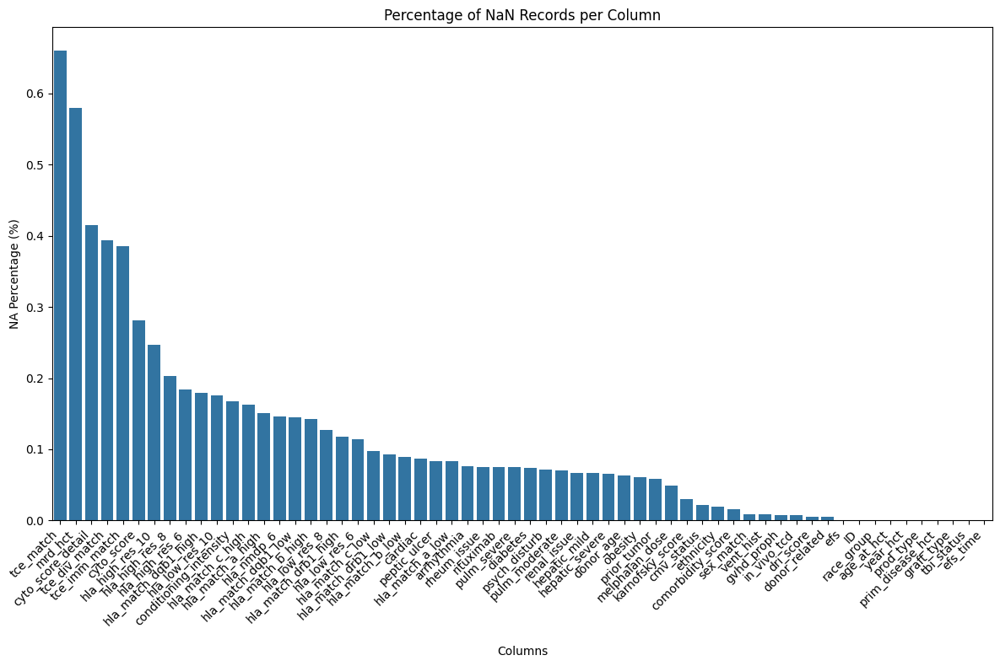

In [19]:
data_manipulator.data_vis.plot_nas(
    data = data_manipulator.datasets["train"]
    )

# Overall target variable split

Checking for whether positive/negative EFS is a particularly small proportion of total

**Key insight** :  While there are more positive than negative EFS in our training dataset, the difference is not so great that we have to worry about severely imbalanced predictor variable at the overall dataset level.
- We may still need to use boostrapping or SMOTE to handle imbalance at subfeature level

efs - 0
efs_time - 0


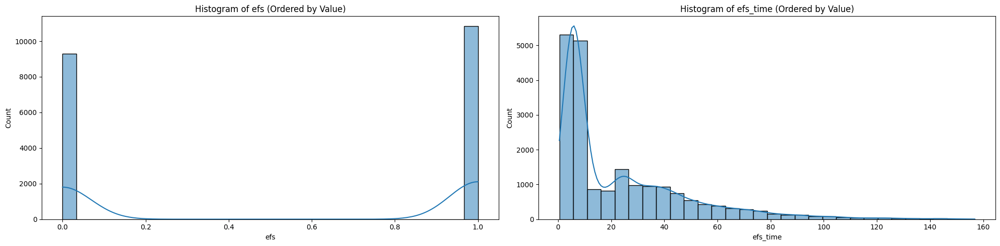

In [20]:
data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = [data_manipulator.data_labels.target_col, "efs_time"], 
        figsize = (20, 5), 
        n_cols = 2
        )

### Statistically unlikely True rates

Using statistics we can highlight feature values which are particularly unusual in their positive EFS rate. This isn't a good way to go through all of the features but can give us some information to start with/ highlight patterns we might want to look into.

Some notable values from the top of the list:

- Lower than expected
    - prod_type: BM
    - in_vivo_tcd: Yes
    - dri_score: N/A - pediatric
 
    
-  Higher than expected
    -  conditioning_intensity: RIC
    -  dri_score: High
    -  cyto_score: Poor
    -  prod_type: PB
    -  cardiac: Yes
    -  prior_tumour: Yes
    -  

In [53]:
# Pull out the overall proportion of "True" in the efs column, and 
# iteratively check all of our feature values for any that are very unlikely to 
# have that many True efs based on assumptions on consistent distribution
# Basically - this gives us an initial highlight of features we may need to pay attention to
# like simple ML models - this assumes feature independence.

true_proportion = round(data_manipulator.data_load.data_distributions["train"]["proportion"][1.0],3)

print(f"Overall true proportion: {true_proportion}")

feature_significance = analyze_feature_significance(
    df = data_manipulator.datasets["train"],
    target_col = TARGET_COLUMN,
    total_positive_rate = true_proportion,
    feature_cols = None,
    positive_value = 1.0,
    max_unique_values = 15
)

display(feature_significance.head(50))

Overall true proportion: 0.539


,,group_size,positives,positive_rate,difference_from_expected,expected_positives,log_probability,probability
feature,value,,,,,,,
bucketed_age,20.044,5122,1772,0.345959,-0.193041,2760.758,-390.486354,0.000000e+00
prod_type,BM,5892,2115,0.358961,-0.180039,3175.788,-390.021347,0.000000e+00
graft_type,Bone marrow,5813,2080,0.357819,-0.181181,3133.207,-389.751489,0.000000e+00
conditioning_intensity,RIC,5423,3737,0.689102,0.150102,2922.997,-258.359291,0.000000e+00
dri_score,High,3281,2329,0.709845,0.170845,1768.459,-204.663409,0.000000e+00
in_vivo_tcd,Yes,7740,3357,0.433721,-0.105279,4171.860,-176.704818,0.000000e+00
cyto_score_detail,Poor,2368,1708,0.721284,0.182284,1276.352,-169.456830,0.000000e+00
prod_type,PB,14268,8743,0.612770,0.073770,7690.452,-163.037826,0.000000e+00
dri_score,N/A - pediatric,3390,1311,0.386726,-0.152274,1827.210,-162.388186,0.000000e+00


**Race group distributions**

We know from the brief that race groups are getting different representations in models, so let's do a quick check of how that shows up in the data.

- "White" has the highest statistical unlikelihood, with more positive EFS than expected
- "More than one race" has second highest unlikelihood with more *negative* EFS than expected
-  Asian distribution almost exactly matches the expected proportion

**Insight:**
- As we investigate our data, we can
    - look at how features co-occur with postive EFS
    - look at how those features are split among racial groups to try to get a sense of imbalance
    - check whether the patterns of co-occurrence still hold when we filter to just the White racial group, as the group that is getting the strongest EFS (to try to highlight if the causal relationship is not in the direction we might expect).

In [55]:
display(feature_significance[feature_significance.index.get_level_values(0) == "race_group"])

group_size  positives  \
feature    value                                                              
race_group White                                            3408       2127   
           More than one race                               3380       1571   
           Black or African-American                        3322       1894   
           American Indian or Alaska Native                 3358       1712   
           Native Hawaiian or other Pacific Islander        3313       1736   
           Asian                                            3379       1818   

                                                      positive_rate  \
feature    value                                                      
race_group White                                           0.624120   
           More than one race                              0.464793   
           Black or African-American                       0.570138   
           American Indian or Alaska Native                0.509827   
           Native Hawaiian or other Pacific Islander       0.523996   
           Asian                                           0.538029   

                                                      difference_from_expected  \
feature    value                                                                 
race_group White                                                      0.085120   
           More than one race                                        -0.074207   
           Black or African-American                                  0.031138   
           American Indian or Alaska Native                          -0.029173   
           Native Hawaiian or other Pacific Islander                 -0.015004   
           Asian                                                     -0.000971   

                                                      expected_positives  \
feature    value                                                           
race_group White                                                1836.912   
           More than one race                                   1821.820   
           Black or African-American                            1790.558   
           American Indian or Alaska Native                     1809.962   
           Native Hawaiian or other Pacific Islander            1785.707   
           Asian                                                1821.281   

                                                      log_probability  \
feature    value                                                        
race_group White                                           -54.648728   
           More than one race                              -41.587575   
           Black or African-American                       -10.777072   
           American Indian or Alaska Native                -10.021624   
           Native Hawaiian or other Pacific Islander        -5.776094   
           Asian                                            -4.292043   

                                                      probability  
feature    value                                                   
race_group White                                         0.000000  
           More than one race                            0.000000  
           Black or African-American                     0.000021  
           American Indian or Alaska Native              0.000044  
           Native Hawaiian or other Pacific Islander     0.003101  
           Asian                                         0.013677

## Category-based EDA

For easier work, I'm going to create rough groups of columns, look at their distributions, and make notes about what I find as I go

In [22]:
cols_checked = ["ID", "efs", "efs_time"]


categories = {
    "demographic": ["race_group", "ethnicity", "age_at_hct", "donor_age", "sex_match", "donor_related"],
    "graft_specific": ["year_hct", "graft_type", "prod_type"],
    "independence": ["psych_disturb", "karnofsky_score", "peptic_ulcer","rheum_issue"],
    "comorbidities": ["cyto_score", "cyto_score_detail", "dri_score", "diabetes", "obesity", "comorbidity_score", "prior_tumor", "vent_hist"],
    "cardiopulmonary_and_renal": ["pulm_moderate", "arrhythmia", "renal_issue", "cardiac", "pulm_severe"], # arguably under comorbidities but there's so many
    "liver_conditions": ["hepatic_severe", "hepatic_mild"],
    "conditioning": ["conditioning_intensity", "tbi_status", "in_vivo_tcd"],
    "medication": ["melphalan_dose", "rituximab", "gvhd_proph"],
    "compatibility": [
        "hla_match_c_high",
        "hla_match_c_low",
		"hla_match_drb1_high",
		"hla_match_drb1_low",
		"hla_match_dqb1_high",
		"hla_match_dqb1_low",
		"hla_match_a_high",
		"hla_match_a_low",
		"hla_match_b_high",
		"hla_match_b_low",
		"hla_high_res_6",
		"hla_high_res_8",
		"hla_high_res_10",
		"hla_low_res_6",
		"hla_low_res_8",
		"hla_low_res_10",
		"hla_nmdp_6",
        "cmv_status"
    ],
    "disease_specific": ["prim_disease_hct", "mrd_hct"],
    "GVHD": ["tce_imm_match", "tce_match", "tce_div_match"]
    
}

for _v in categories.values():
    cols_checked = cols_checked + _v

print([_c for _c in data_manipulator.data_labels.all_cols if not _c in cols_checked])

[]


## Demographic comparisons

**When in edit mode on this notebook - double click on chart images to see them in more detail**

### Observations

- Age
    - Negative outcome seems to have higher representation at earlier ages, perhaps because children are more vulnerable, or because this kind of proceedure, applied to a child is the result of a serious condition
        - In application, it's important for "surivivability" estimates to be weighed against the total benefit of extending the life of young people
    - Ages seem to be very fine-grained, bucketing into at least whole years is probably a good start
        - Should be careful to keep "0" year ages separate from non-0
            - Create separate boolean for "age is 0"
    - Pattern consistent for white race group

- Donor Age
    - There is a much heavier showing of younger donors than older
    - That said, the distribution between positive and negative outcomes are relatively similar
    - Large number of missing ages
        - It looks as though the missing ages are skewed towards negative EFS, it is possible they are MNAR (maybe situations where the age isn't recorded means other things are missed?).
        - EFS across most ages seems to be quite consistent and then around 60 it diverges with sudden improvement in EFS that is around the same magnitude as the negative swing for na so it's possible that the na data is for older ages, but we can't guarantee that'll be the case for future
          - Probably best to have boolean for >40 and have a separate boolean for age missing
      - Broadly similar pattern for white race group

- Donor Related
    - Majority of donors seem to be related
    - Potentially some positive skew in cases where it is a specific donor and their relationship is known, but that could also be a factor of multiple-donors/donor relationship unknown being a very small part of the dataset

- Sex Match
    - Potentially some positive skew for cross-sex donations?
        - There is apparently some evidence that cross-sex donations can have positive graft-versus-leukemia effects, but that they can also increase risk of graft-versus-host disease. I'm not a subject matter expert so taking this all with a pinch of salt - could still be explained by correlations with other factors

- Ethnicity
    - Non-hispanic outweighs other ethnicities
    - Slight negative skew in hispanic/latino, pronounced negative skew in "Non-resident of the US"
        - Unknown whether "non-resident" is people who have been flown to the US for healthcare, or other categories

- Race
    - While there is roughly equal representation across races, there is a particular positive skew for the "white" race group, and a somewhat pronounced negative skew for the "More than one race" group.


 **Key insight:** Given that part of the aim of this work is to reduce bias in ML estimates for different race groups - it's important that we manage these skews in these metrics.
     - Correlations may help us understand how to handle these skews

**Key insight** While we don't have a category telling us sex of the recipient, we could estimate it based on this
- Sex of recipient
- Sex of donor
- Boolean for sex-match

age_at_hct - 0
donor_age - 1266


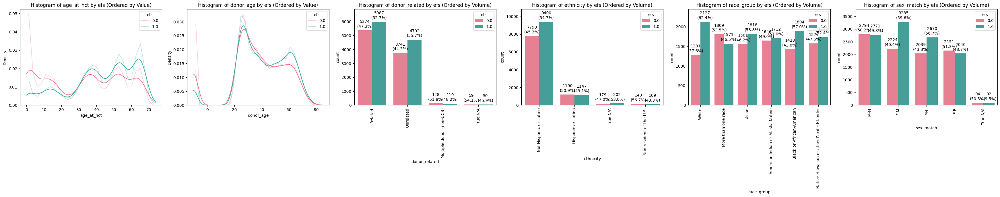

age_at_hct - 0
donor_age - 0


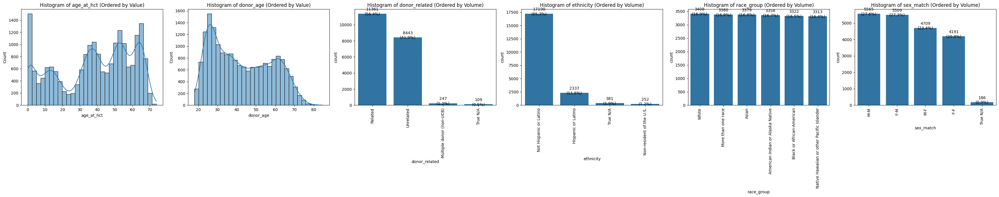

In [23]:
# Double click on images to see them in more detail

category = "demographic"

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (35, 7), 
        n_cols = 6,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = -10 # In this case it's fairly clear that -10 is not a correct value
        )


data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories["demographic"],
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (35, 7), 
        n_cols = 6
        )




age_at_hct - 0
donor_age - 151


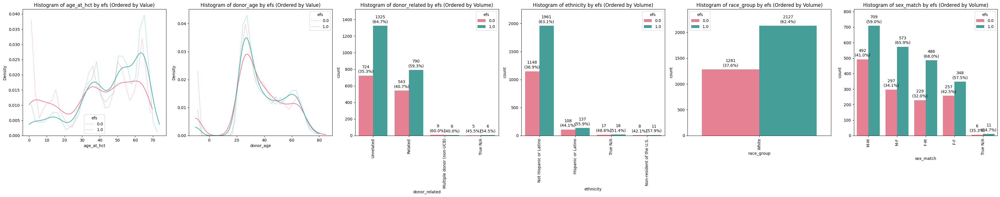

In [24]:
# Visualise how features cooccur with positive EFS in just-white populace


# Plot features against target variable
just_white = data_manipulator.datasets["train"][data_manipulator.datasets["train"]["race_group"]=="White"]

data_manipulator.data_vis.plot_grid(
        data = just_white, 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (35, 7), 
        n_cols = 6,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = -10 # In this case it's fairly clear that -10 is not a correct value
        )

## Graft-specific factors

**When in edit mode on this notebook - double click on chart images to see them in more detail**

- graft_type
    - Positive EFS skew for blood, negative skew for bone marrow
    - "More than one race" has an unusually high proportion of bone marrow transplants
    - Positive EFS skew present even when data filtered to just white populace
- prod_type
    - Duplicate of graft_type
- year_hct
    - Some variation in EFS in years, but no real sign of a trend over time
    - Consider one-hot encoding years

**Insight:** 
- Remove "prod_type" column
- Consider SMOTE to feed more non-bone marrow samples in to model


year_hct - 0


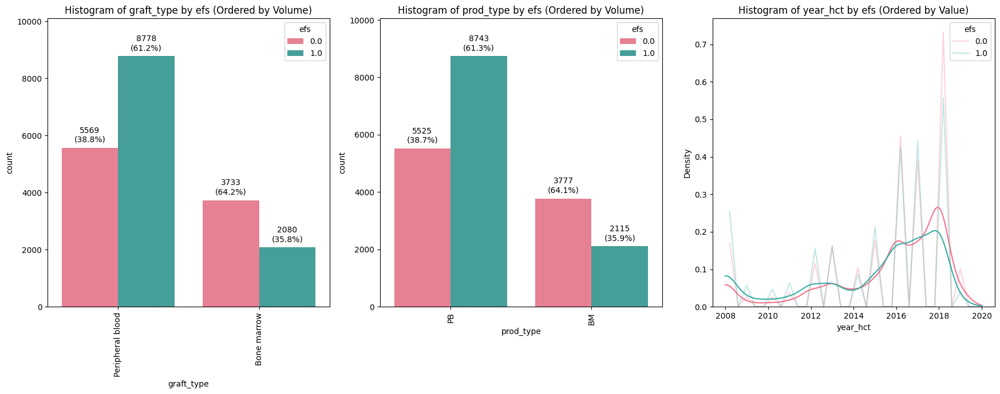

year_hct - 0


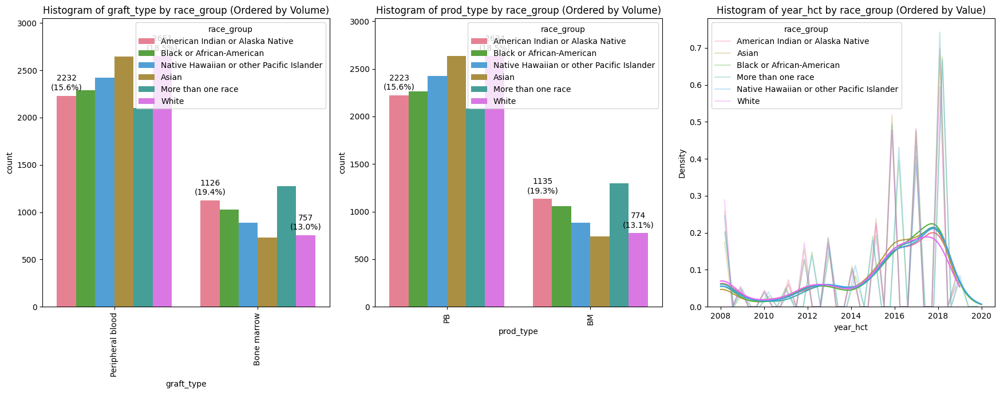

year_hct - 0


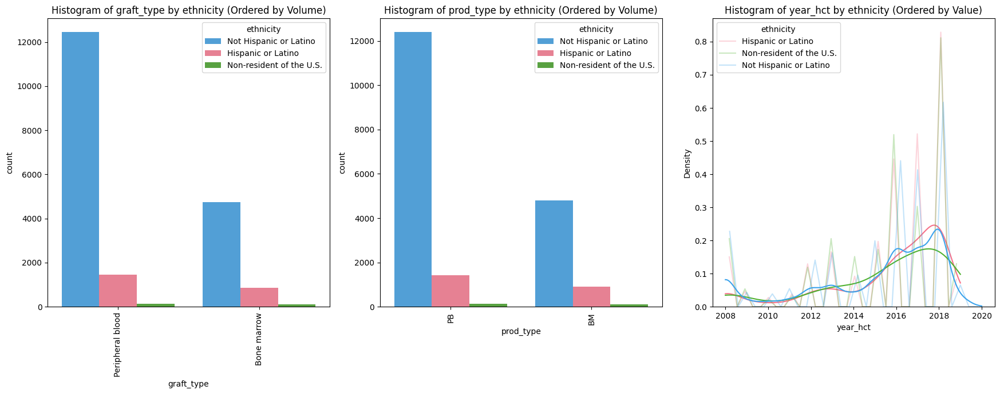

year_hct - 0


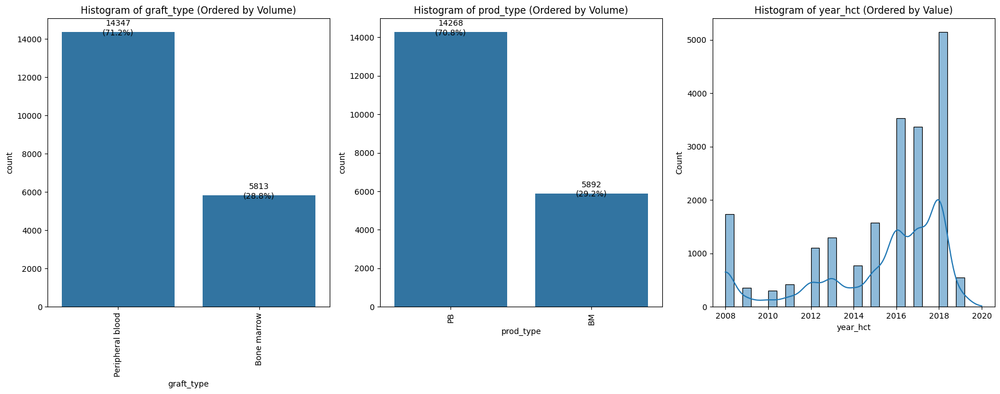

In [25]:
category = "graft_specific"

# Plot features against target variable

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (35, 7), 
        n_cols = 6,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = -10,
        show_values = True
        )

# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (35, 7), 
        n_cols = 6,
        group_column = "race_group",
        na_replacement_continuous = -10,
        show_values = True
        )

# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (35, 7), 
        n_cols = 6,
        group_column = "ethnicity",
        na_replacement_continuous = -10,
        show_values = True
        )

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category],
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (35, 7), 
        n_cols = 6
        )

year_hct - 0


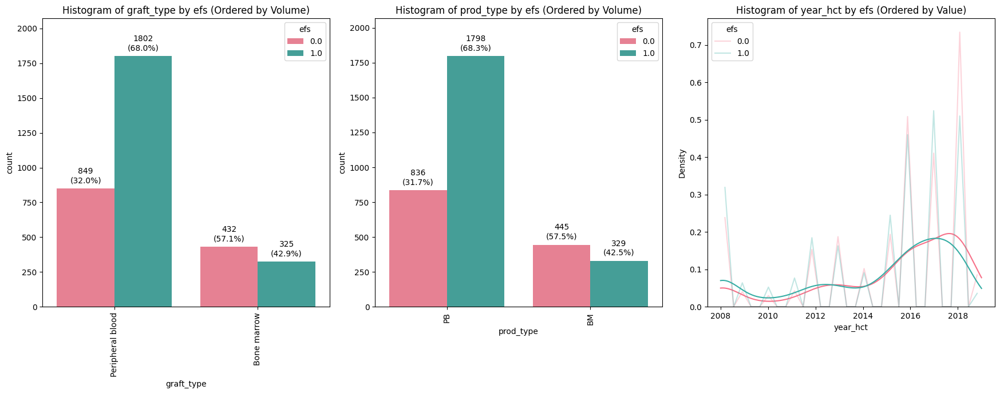

In [26]:
# Visualise how features cooccur with positive EFS in just-white populace


# Plot features against target variable
just_white = data_manipulator.datasets["train"][data_manipulator.datasets["train"]["race_group"]=="White"]

data_manipulator.data_vis.plot_grid(
        data = just_white, 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (35, 7), 
        n_cols = 6,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = -10,
        show_values = True
        )

## Indepdendence

**When in edit mode on this notebook - double click on chart images to see them in more detail**

- karnofsky_score
    - slight skew towards negative efs at higher scores, and inverse at lower
    - consistent in white-only populace
- peptic_ulcer
    - confirmed lack of ulcer correlates somewhat with positive efs
    - even stronger in white-only populace
- psych_disturb
    - may not be predictive - positive psych_disturb has slightly stronger skew towards positive EFS but not by much
    - pattern even stronger in white-only populace
- rheum_issue
    - confirmed lack of rheum_issue has skew towards positive EFS, confirmed rheum_issue is more evenly balanced but is a small part of the data
    - similar in white-only populace

karnofsky_score - 595


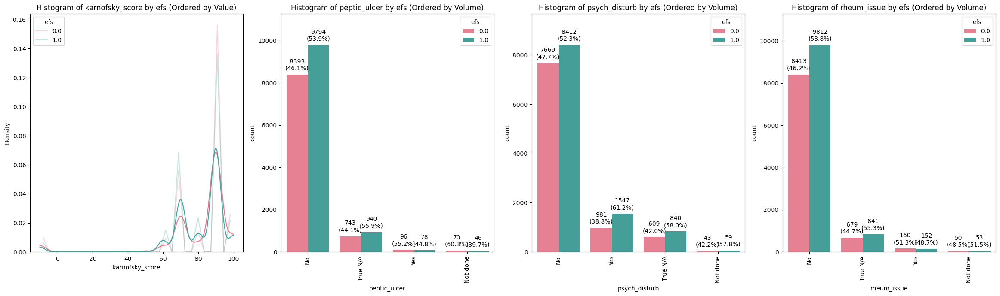

karnofsky_score - 595


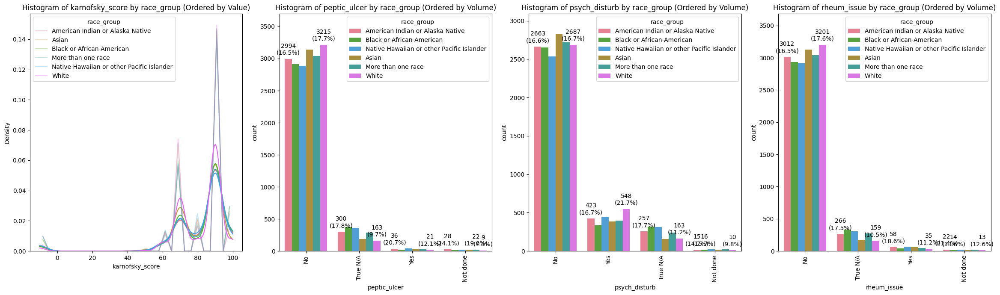

karnofsky_score - 595


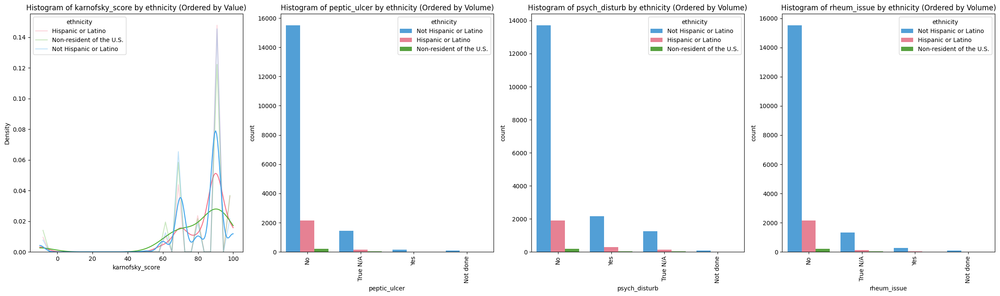

karnofsky_score - 0


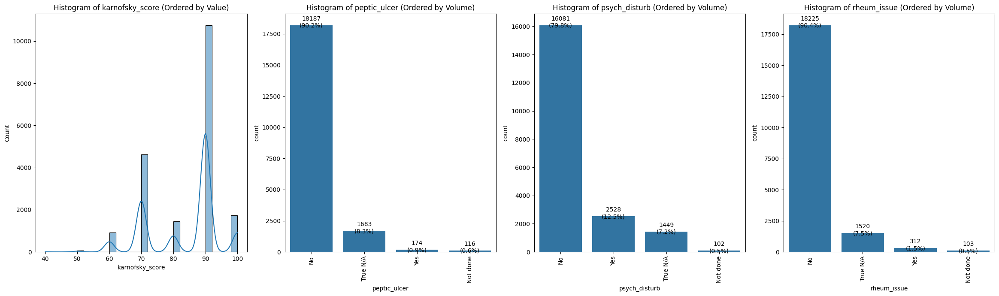

In [27]:
category = "independence"

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (35, 7), 
        n_cols = 6,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = -10,
        show_values = True
        )

# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (35, 7), 
        n_cols = 6,
        group_column = "race_group",
        na_replacement_continuous = -10,
        show_values = True
        )

# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (35, 7), 
        n_cols = 6,
        group_column = "ethnicity",
        na_replacement_continuous = -10,
        show_values = True
        )

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category],
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (35, 7), 
        n_cols = 6
        )

karnofsky_score - 53


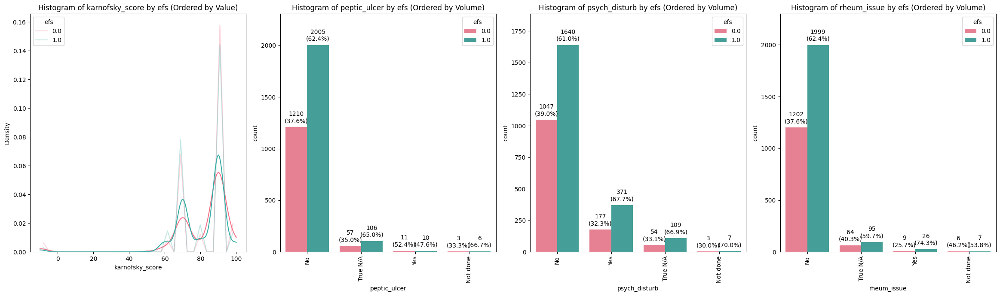

In [28]:
# Visualise how features cooccur with positive EFS in just-white populace


# Plot features against target variable
just_white = data_manipulator.datasets["train"][data_manipulator.datasets["train"]["race_group"]=="White"]

data_manipulator.data_vis.plot_grid(
        data = just_white, 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (35, 7), 
        n_cols = 6,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = -10,
        show_values = True
        )

## Comorbidity

**When in edit mode on this notebook - double click on chart images to see them in more detail**

Aspects of health that could contribute to Event Free Survival

- comorbidity_score
    - sorror comorbidity score which tries to predict complications after transplant
        - is based on the presence and severity of specific comorbid conditions, including:
            - Heart disease (e.g., arrhythmias, congestive heart failure)
            - Lung disease (e.g., chronic obstructive pulmonary disease, pulmonary hypertension)
            - Liver disease (e.g., cirrhosis, hepatitis)
            - Renal disease (e.g., moderate or severe kidney impairment)
            - Diabetes requiring insulin
            - Prior solid tumors
            - Infections or inflammatory conditions
            - Each condition is assigned a weight, and the total score is calculated as the sum of these weights.
    - Seems as though *lower* comorbidity scores are occurring with more negative EFS, this is the opposite of what we would expect
    - Pattern continues with white-only populace

- cyto_score
    - Only category that *doesn't* skew towards positive EFS is True N/A
        - True N/A is unusually present with "more than one race" racial groups, "intermediate" and "favourable" are unusualy present with white group.
        - "Poor" is unusually present with asian race group.
    - Overall trend still present in white-populace
    - Consider boolean for missing cyto_score

- cyto_score_detail
    - Seems to be the same categories as cyto_score but with more missing
    - Remove cyto_score_detail

- diabetes
    - Only category that doesn't skew towards positive EFS is when data is marked as missing
        - Perhaps when patients are particularly sick the diabetes check isn't done?
        - This is a very slim category so might not be all that useful
        - Consistent in white-only populace
     
 - dri_score
     - Any version of "missing" consistently cooccurs with negative EFS
     - Pattern is *not* as pronounced in white-only populace, but still somewhat there
       
- obesity
    - All recorded readings show skew towards positive efs
    - Not done category shows small negative skew but the sample size is small
    - Pattern roughly same in white-only populace
      
-  vent_hist
    - "No" vent_hist is skewed towards positive
    - Presence of vent_hist is more even, could be useful as a feature
    - Missing data is also 50/50, could treat it as positive vent_hist, particularly given how infrequently it comes up
    - Pattern consistent in white-only populace

         
**Insight:** 
- Categories that seem most at risk are when the measurements are missing for various reasons, but that could end up being a race/demographic-by-proxy measurement because of differing access to healthcare

comorbidity_score - 322


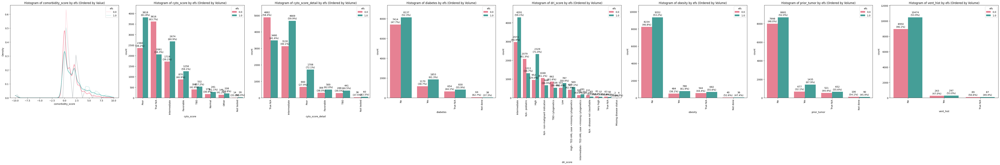

comorbidity_score - 322


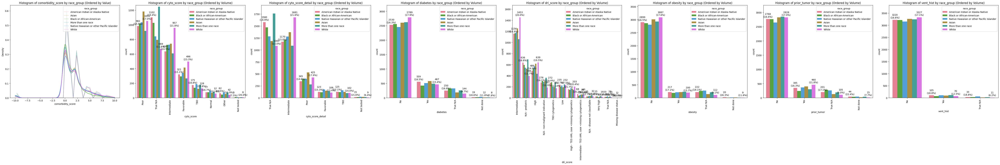

comorbidity_score - 322


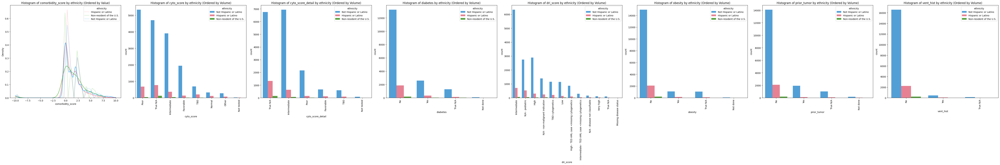

comorbidity_score - 0


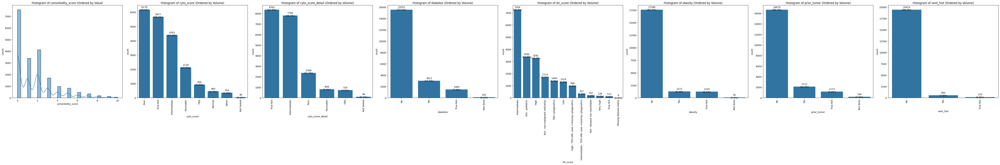

In [29]:
category = "comorbidities"

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (60, 10), 
        n_cols = 8,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = -10,
        show_values = True
        )

# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (60, 10), 
        n_cols = 8,
        group_column = "race_group",
        na_replacement_continuous = -10,
        show_values = True
        )

# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (60, 10), 
        n_cols = 8,
        group_column = "ethnicity",
        na_replacement_continuous = -10,
        show_values = True
        )

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category],
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (60, 10), 
        n_cols = 8
        )

comorbidity_score - 35


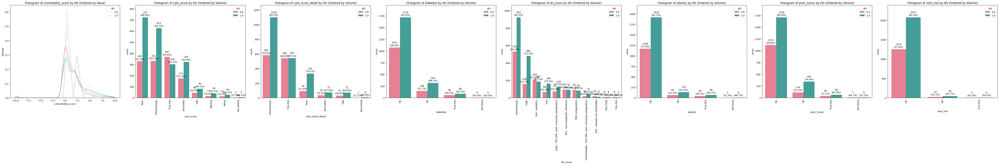

In [30]:
# Visualise how features cooccur with positive EFS in just-white populace


# Plot features against target variable
just_white = data_manipulator.datasets["train"][data_manipulator.datasets["train"]["race_group"]=="White"]

data_manipulator.data_vis.plot_grid(
        data = just_white, 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (60, 10), 
        n_cols = 8,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = -10,
        show_values = True
        )

## Cardiopulmonary and renal

**When in edit mode on this notebook - double click on chart images to see them in more detail**

- arrythmia
    - All skew towards positive, proportionally "no" is less heavily skewed
    - Pattern less strong in white-only populace ("yes" also has heavy skew towards positive EFS)


- cardiac
    - All skew towards positive, proportionally "yes" is more heavily skewed
    - In white-only populace - "yes" has even stronger skew towards positive EFS

- pulm_moderate
    - All skew towards positive, proportionally "no" is less heavily skewed
    - In white-only populace - "yes" has even stronger skew towards positive EFS
      
- pulm_severe
    - All skew towards positive, proportionally "no" is less heavily
    - In white-only populace - "yes" has even stronger skew towards positive EFS
    
- renal_issue
    - No and N/A skew positive (but N/A less than no)
    - Yes and Not done skew negative, but are very small subsets
    - In white-only populace - "yes" has even stronger skew towards positive EFS

**Insight:**
- co-occurrence with positive EFS could be affected by other race-related factors because "no" has strongest co-occurrence overall with positive EFS but "yes" has even stronger co-occurrence when data filtered to just white patients
- Will need to test models with and without these features

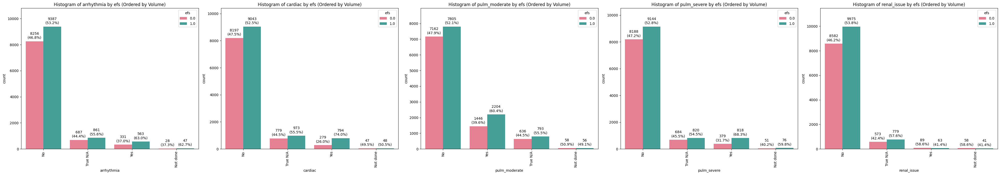

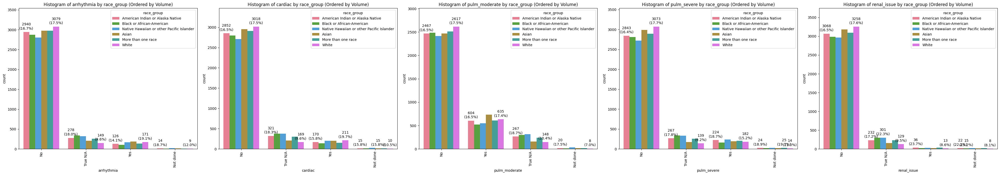

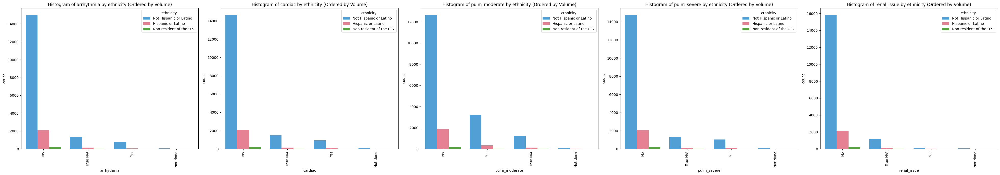

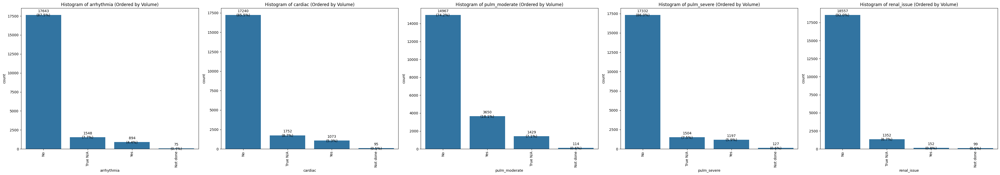

In [50]:
category = "cardiopulmonary_and_renal"

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (55, 7), 
        n_cols = 7,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = -10,
        show_values = True
        )

# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (55, 7), 
        n_cols = 7,
        group_column = "race_group",
        na_replacement_continuous = -10,
        show_values = True
        )

# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (55, 7), 
        n_cols = 7,
        group_column = "ethnicity",
        na_replacement_continuous = -10,
        show_values = True
        )

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category],
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (55, 7), 
        n_cols = 7
        )

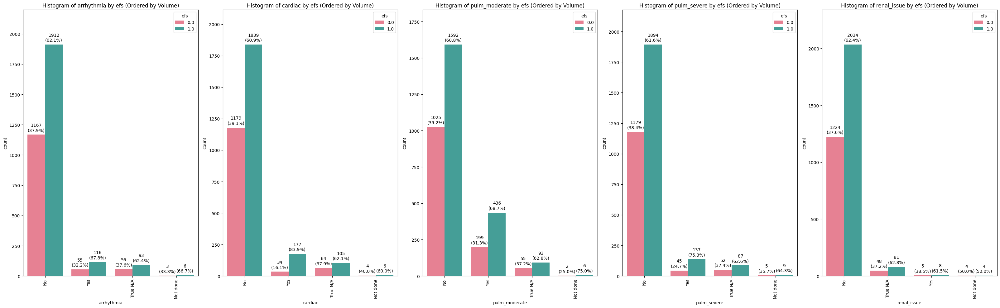

In [32]:
# Visualise how features cooccur with positive EFS in just-white populace


# Plot features against target variable
just_white = data_manipulator.datasets["train"][data_manipulator.datasets["train"]["race_group"]=="White"]

data_manipulator.data_vis.plot_grid(
        data = just_white, 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = -10,
        show_values = True
        )

## Liver conditions

**When in edit mode on this notebook - double click on chart images to see them in more detail**

- hepatic_mild 
    - All groups except "not done" show a skew towards positive EFS
- hepatic_severe
    - Confirmed Yes shows more negative EFS, though there is some racial class imbalance there

- combined hepatic_mild and severe into one feature which shows "any confirmed no", "any confirmed yes", and then not done/ true n/a
    - Has a skew towards negative EFS for confirmed "yes", but is closer to 50/50 than the hepatic_severe feature by itself
    - Reduces the "not done" to almost nothing but doesn't make much of a dent in the True N/A which has a racial imbalance

**Insight:** 
- Combining the features wasn't too useful
    - Remove combined feature
- Test removing hepatic_mild and reducing hepatic_severe to just "confirmed yes" to reduce impact of missing data (MNAR)

In [33]:
# Combine liver conditions into one column

data_manipulator.flexibly_apply_function(
    target_function = summarise_checks,
    column_list = categories["liver_conditions"],
    output_name ="liver_conditions_mild_severe",
    lowercase_cols = True,
    
    categories_to_check_for = ["yes", "no", "not done", "true n/a"]
)

categories["liver_conditions"] = list(set(categories["liver_conditions"]+["liver_conditions_mild_severe"]))

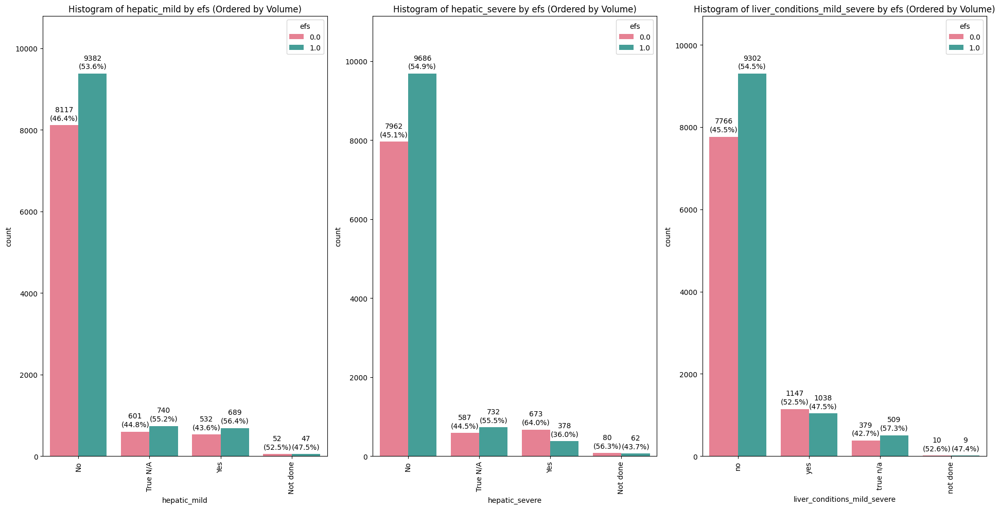

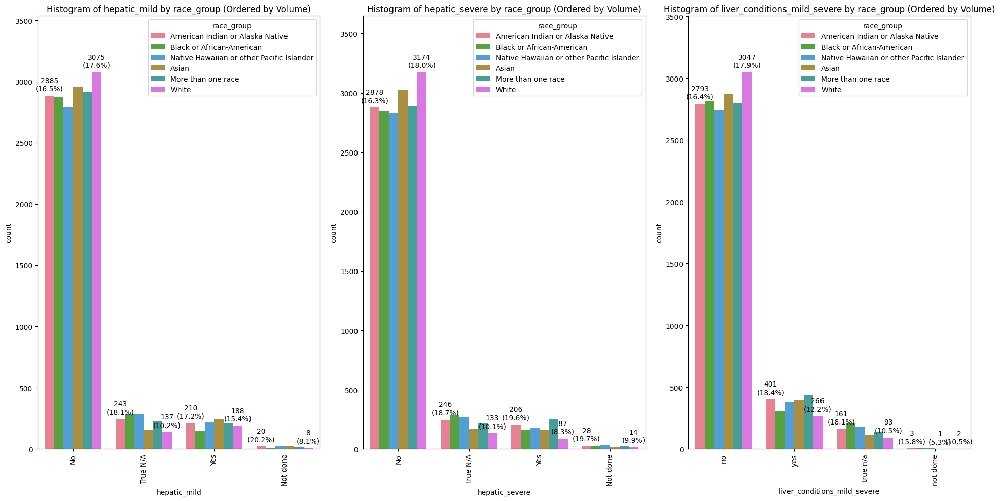

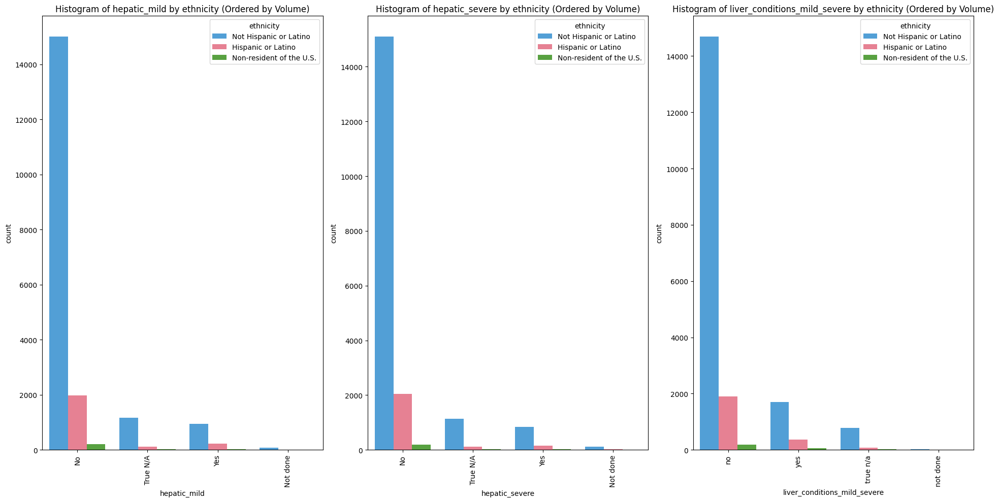

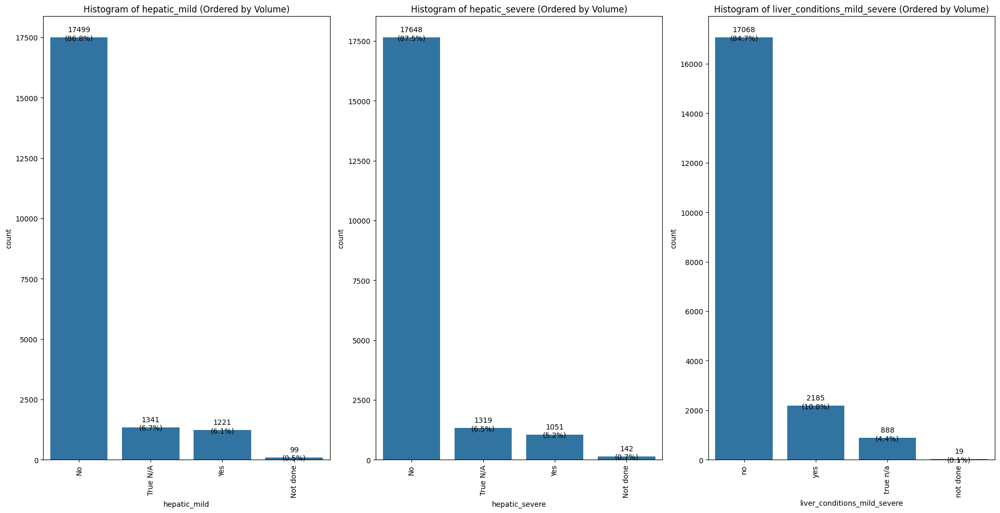

In [34]:
category = "liver_conditions"

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = -10,
        show_values = True
        )


# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7,
        group_column = "race_group",
        na_replacement_continuous = -10,
        show_values = True
        )

# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7,
        group_column = "ethnicity",
        na_replacement_continuous = -10,
        show_values = True
        )

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category],
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7
        )

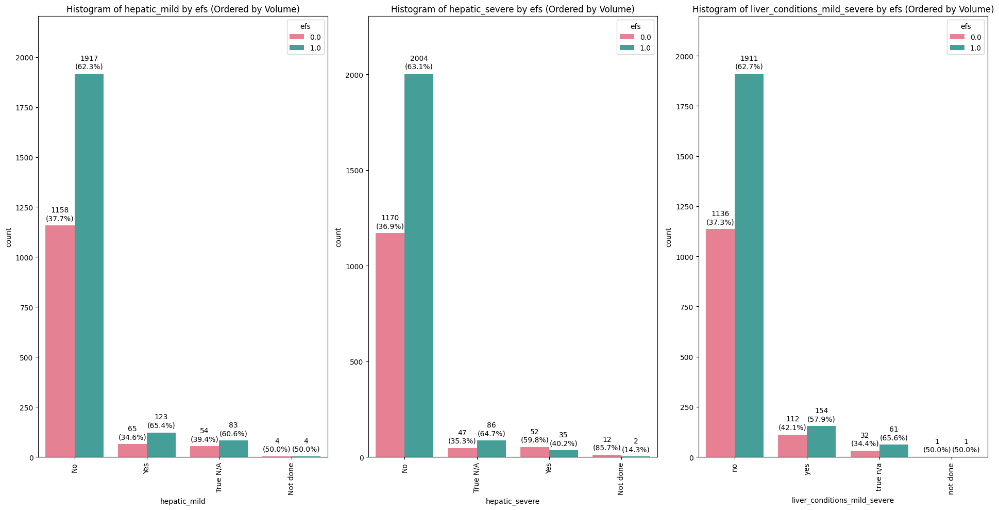

In [35]:
# Visualise how features cooccur with positive EFS in just-white populace


# Plot features against target variable
just_white = data_manipulator.datasets["train"][data_manipulator.datasets["train"]["race_group"]=="White"]

data_manipulator.data_vis.plot_grid(
        data = just_white, 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = -10,
        show_values = True
        )

## Conditioning

**When in edit mode on this notebook - double click on chart images to see them in more detail**

- conditioning_intensity
    - Strong positive EFS for most things except missing data
        - Asian and White strong representation in MAC and RIC
            - RIC has a statistically unlikely number of EFS positives assuminig consistent distribution
        - "Mixed" has strong representation in missing data
- in_vivo
    - Positive EFS for "no", can probably assume that missing data is "Yes"
        - Mixed race has strong representation in "Yes"
          
- tbi_status
    - Some smaller categories reverse the trend


**Insight:** Keep all, one-hot-encode, and test
- Missing data for conditioning intensity should be own category
- Can reduce in_vivo to just "confirmed no in_vivo" given small number of missing datapoints 

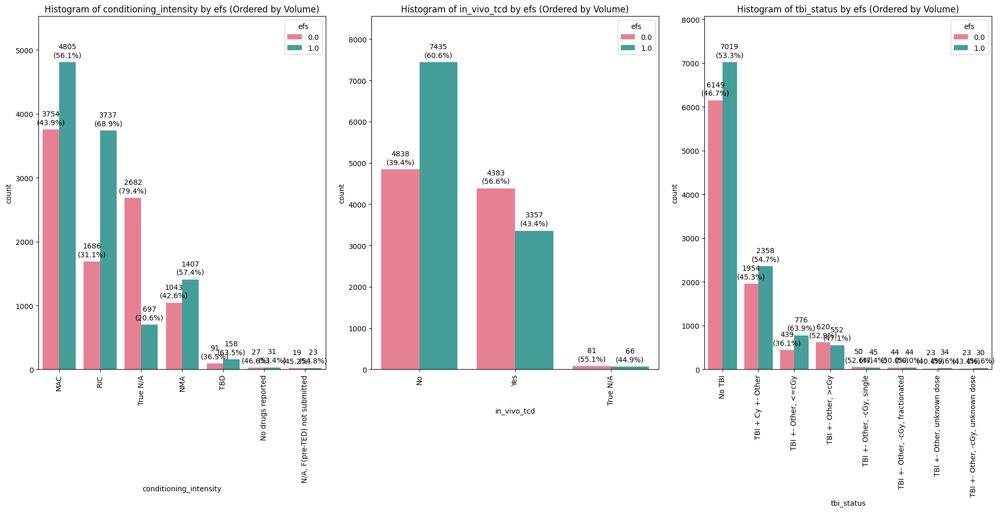

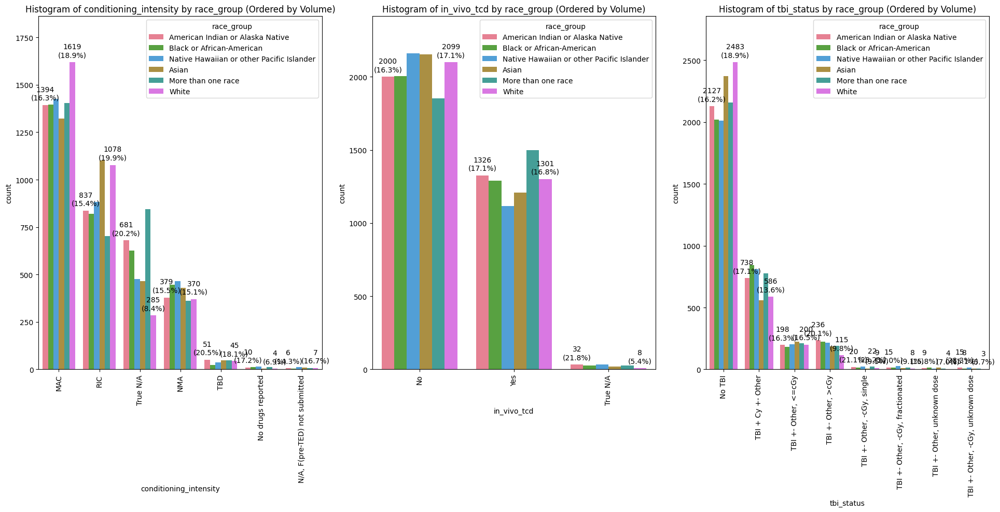

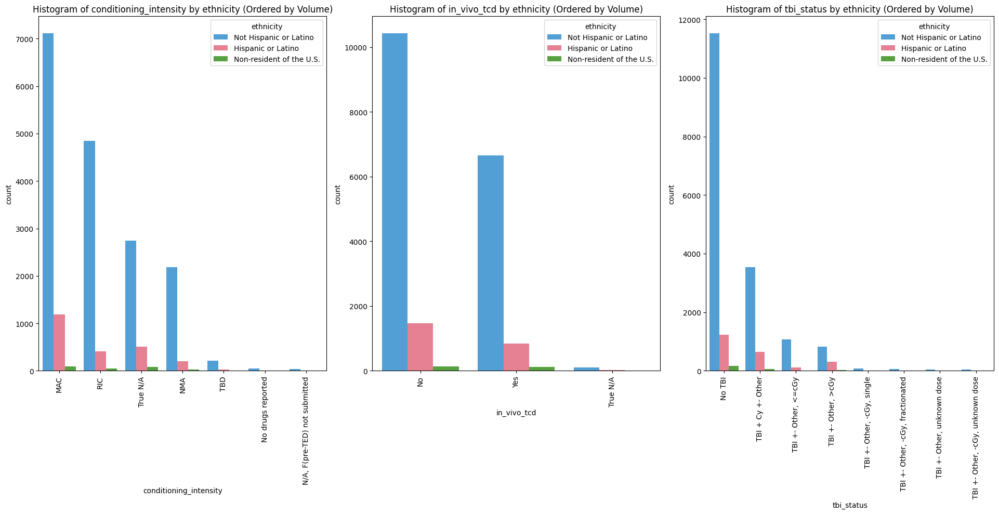

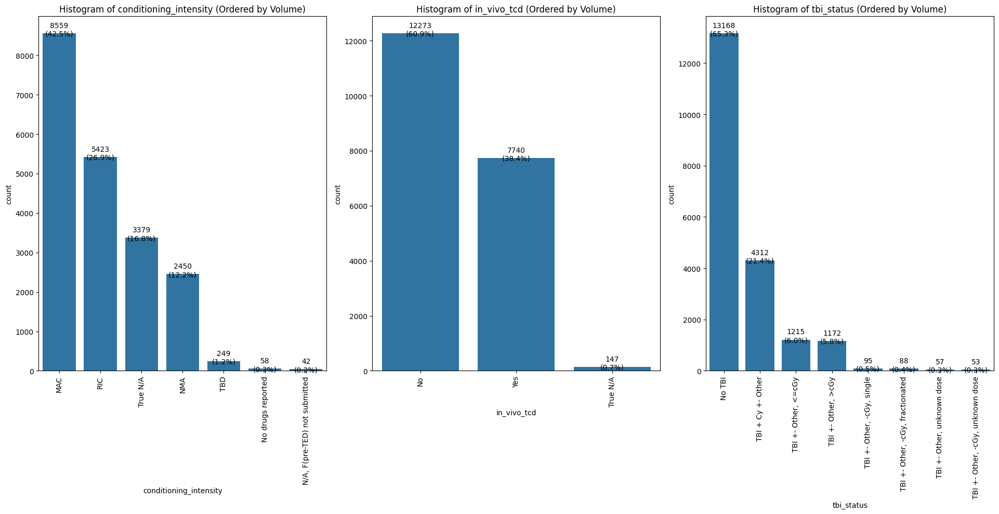

In [58]:
category = "conditioning"

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = -10,
        show_values = True
        )


# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7,
        group_column = "race_group",
        na_replacement_continuous = -10,
        show_values = True
        )
# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7,
        group_column = "ethnicity",
        na_replacement_continuous = -10,
        show_values = True
        )


data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category],
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7
        )

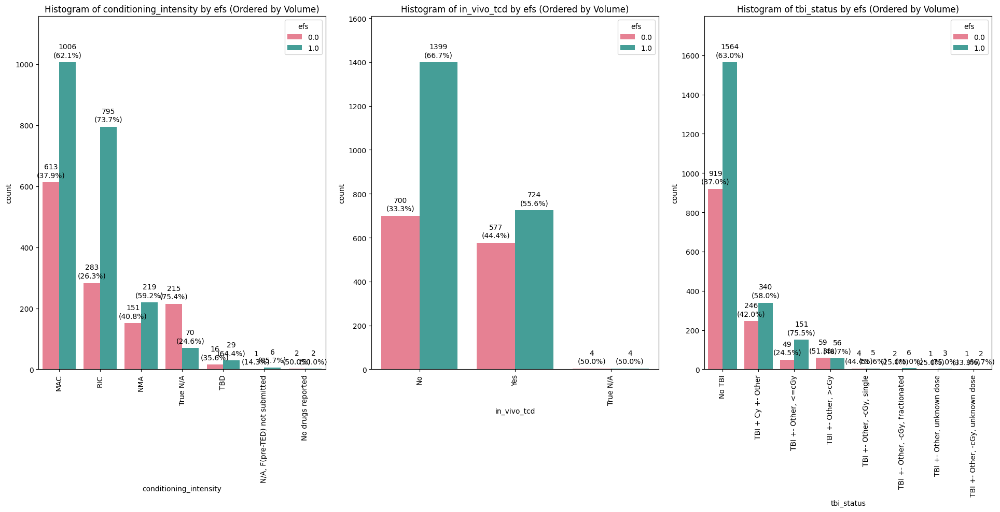

In [59]:
# Visualise how features cooccur with positive EFS in just-white populace


# Plot features against target variable
just_white = data_manipulator.datasets["train"][data_manipulator.datasets["train"]["race_group"]=="White"]

data_manipulator.data_vis.plot_grid(
        data = just_white, 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = -10,
        show_values = True
        )

## Medication

**When in edit mode on this notebook - double click on chart images to see them in more detail**

- gvhd_proph
    - Strong positive EFS  for "FK + MMF +- others" as well as "FK + MTX +-others (not MFF)" which has strong white and asian showing
    - Less strong positive EFS for cyclophosphamide which has strong black showing
    - Nagetive EFS for CSA MMF + others(not FK) which has strong native american, alaskan, and mixed showing
    - Same order of magnitude for white-only subcategory, though greater proportion of people getting those most effective medications
      
- melphalan_dose
    - missing data is least well correlated with positive EFS
        - This feature doesn't seem to be terribly strongly predictive and has racial bias, maybe simplest to remove

- rituximab
    - More clear positive EFS if not given
    - Some racial bias but not as bad as elsewhere

**Insight:** 
- Keep gvhd_proph but resample
- Remove melphalan_dosse
- Keep rituximab but reduce to just "confirmed negative"

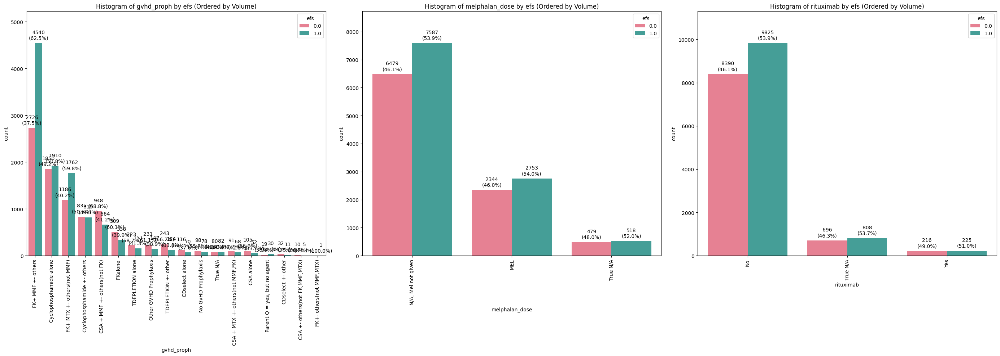

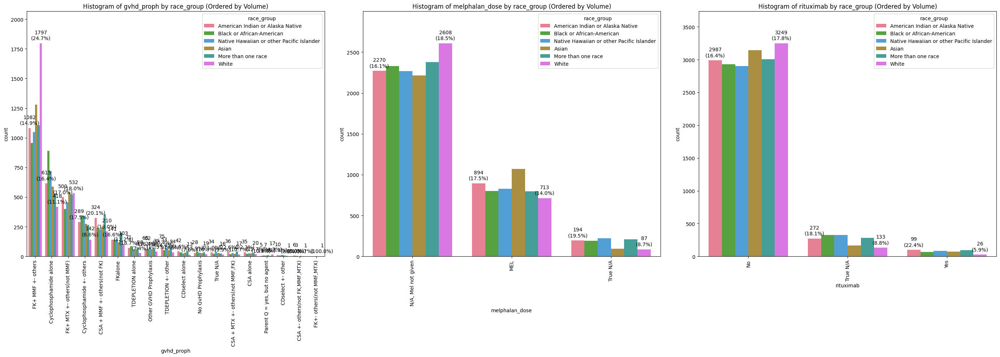

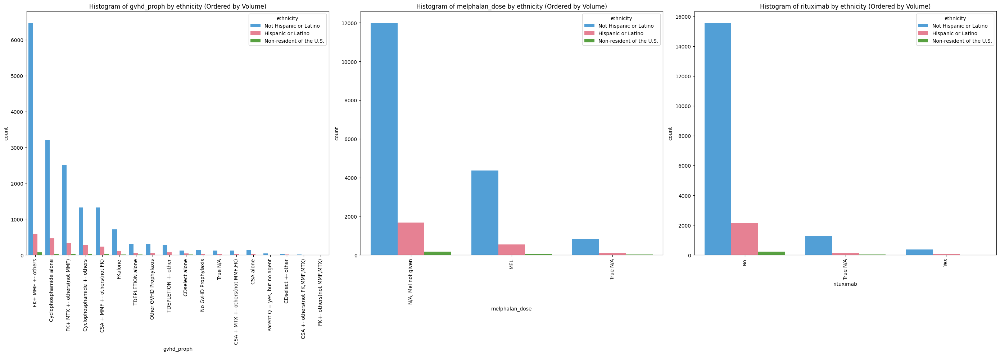

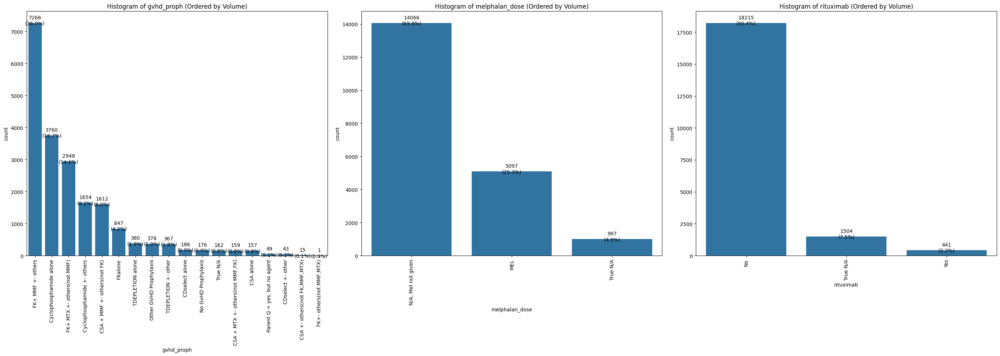

In [56]:
category = "medication"

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (65, 10), 
        n_cols = 7,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = -10,
        show_values = True
        )

# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (65, 10), 
        n_cols = 7,
        group_column = "race_group",
        na_replacement_continuous = -10,
        show_values = True
        )

# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (65, 10), 
        n_cols = 7,
        group_column = "ethnicity",
        na_replacement_continuous = -10,
        show_values = True
        )


data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category],
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (65, 10), 
        n_cols = 7
        )

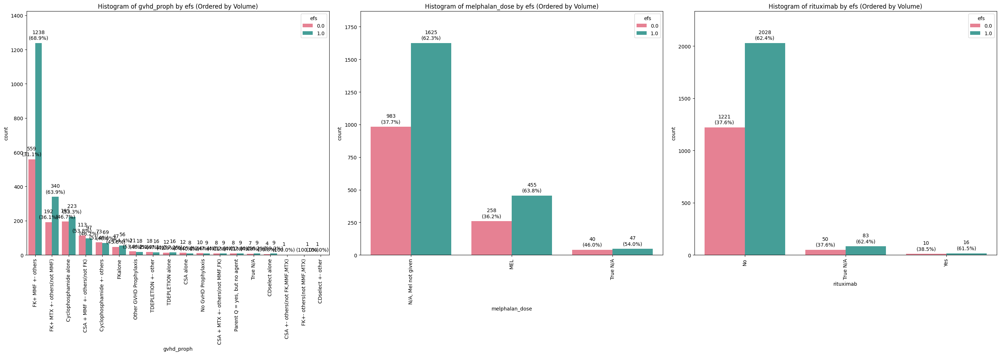

In [57]:
# Visualise how features cooccur with positive EFS in just-white populace


# Plot features against target variable
just_white = data_manipulator.datasets["train"][data_manipulator.datasets["train"]["race_group"]=="White"]

data_manipulator.data_vis.plot_grid(
        data = just_white, 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (65, 10), 
        n_cols = 7,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = -10,
        show_values = True
        )

## Compatibility

- Continuous columns

    - Doesn't seem to be terribly clear patterns but we'll cut down the column number, add into our model and see if anything ends up being important

    - hla_res_number High resolution columns have more missing values so we'll coalesce low-res into high res and drop low res
        - 8 and 10 are missing more data than 6
        
    - hla_match_letter_resolution High resolution columns have no more missing values so we can remove the lower res
      
    - dqb1 and drb1 high_res is missing more data than low res so we'll coalesce low res into high res and drop low res

- Categorical column

    - cmv_status
        - +/+ and -/+ cooccur with positive EFS, so does -/- to an extent
            - +/+ has strong black and asian showing
            - -/+ and -/- has more prominent white showing


**Insight**: 
- Remove high res columns for _6, _8, _10
- Remove low res for match_a, match_b, match_c

In [38]:
for _num in [6, 8, 10]:
    high_res_missing = data_manipulator.datasets["train"][f"hla_high_res_{_num}"].isna().sum()
    low_res_missing = data_manipulator.datasets["train"][f"hla_low_res_{_num}"].isna().sum()
    
    print(f"{_num} High res missing: {high_res_missing} Low res missing: {low_res_missing}")

for _match_type in ["a", "b", "c"]:
    high_res_missing = data_manipulator.datasets["train"][f"hla_match_{_match_type}_high"].isna().sum()
    low_res_missing = data_manipulator.datasets["train"][f"hla_match_{_match_type}_high"].isna().sum()
    
    print(f"{_match_type} High res missing: {high_res_missing} Low res missing: {low_res_missing}")
    

for _match_type in ["dqb1", "drb1"]:
    high_res_missing = data_manipulator.datasets["train"][f"hla_match_{_match_type}_low"].isna().sum()
    low_res_missing = data_manipulator.datasets["train"][f"hla_match_{_match_type}_high"].isna().sum()
    
    print(f"{_match_type} High res missing: {high_res_missing} Low res missing: {low_res_missing}")


6 High res missing: 3710 Low res missing: 2302
8 High res missing: 4096 Low res missing: 2574
10 High res missing: 4987 Low res missing: 3537
a High res missing: 3032 Low res missing: 3032
b High res missing: 2880 Low res missing: 2880
c High res missing: 3271 Low res missing: 3271
dqb1 High res missing: 2928 Low res missing: 3609
drb1 High res missing: 1865 Low res missing: 2374


Cols we'll drop
['hla_match_c_low', 'hla_match_drb1_low', 'hla_match_dqb1_low', 'hla_match_a_low', 'hla_match_b_low', 'hla_high_res_6', 'hla_high_res_8', 'hla_high_res_10']
hla_low_res_10 - 0
hla_low_res_6 - 0
hla_low_res_8 - 0
hla_match_a_high - 0
hla_match_b_high - 0
hla_match_c_high - 0
hla_match_dqb1_high - 0
hla_match_drb1_high - 0
hla_nmdp_6 - 0


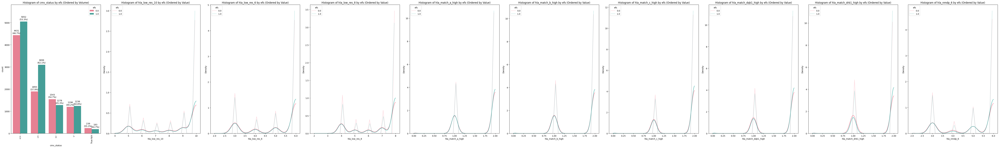

hla_low_res_10 - 0
hla_low_res_6 - 0
hla_low_res_8 - 0
hla_match_a_high - 0
hla_match_b_high - 0
hla_match_c_high - 0
hla_match_dqb1_high - 0
hla_match_drb1_high - 0
hla_nmdp_6 - 0


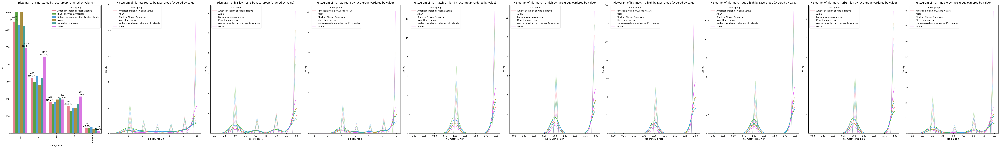

hla_low_res_10 - 0
hla_low_res_6 - 0
hla_low_res_8 - 0
hla_match_a_high - 0
hla_match_b_high - 0
hla_match_c_high - 0
hla_match_dqb1_high - 0
hla_match_drb1_high - 0
hla_nmdp_6 - 0


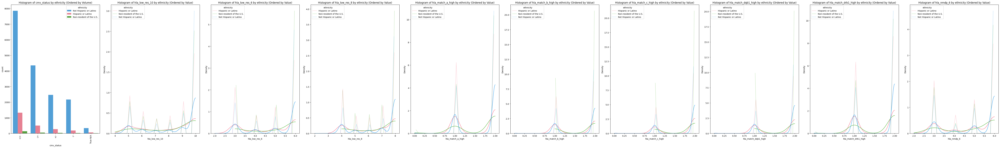

hla_low_res_10 - 0
hla_low_res_6 - 0
hla_low_res_8 - 0
hla_match_a_high - 0
hla_match_b_high - 0
hla_match_c_high - 0
hla_match_dqb1_high - 0
hla_match_drb1_high - 0
hla_nmdp_6 - 0


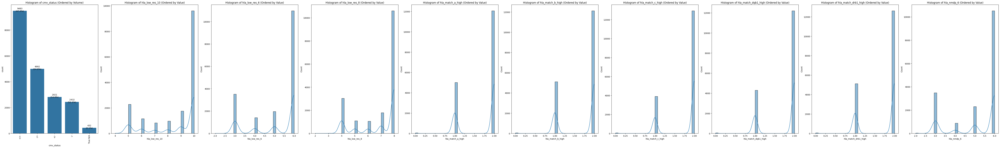

In [39]:
category = "compatibility"

cols_to_visualise = [_c for _c in categories[category] if 
                     not "high_res" in _c 
                     and not "match_a_low" in _c 
                     and not "match_b_low" in _c 
                     and not "match_c_low" in _c
                     and not "dqb1_low" in _c
                     and not "drb1_low" in _c
                    ]

print("Cols we'll drop")
print([_c for _c in categories[category] if not _c in cols_to_visualise])


data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = cols_to_visualise, 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (120, 10), 
        n_cols = 18,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = np.nan,
        show_values = True
        )


# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = cols_to_visualise, 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (120, 10), 
        n_cols = 18,
        group_column = "race_group",
        na_replacement_continuous = np.nan,
        show_values = True
        )

# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = cols_to_visualise, 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (120, 10), 
        n_cols = 18,
        group_column = "ethnicity",
        na_replacement_continuous = np.nan,
        show_values = True
        )


data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = cols_to_visualise,
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (120, 10), 
        n_cols = 18
        )

## Disease-specific

- mrd_hct
    - Fairly even spread across racial groups
    - Recorded data, particularly "negative" has cooccurence with positive EFS
        - Difference not-so stark when filtered to just white racial group - the N/A data is closer to "negative" proportions
    - Over 50% missing, perhaps just create boolean with "confirmed negative"

- prim_disease_hct
    - ALL, AML, MDS, IPA cooccur with positive EFS
        - AML has particularly strong black, native, and white showing
    - IEA, IIS, PCD cooccur with negative EFS
        - Have particularly strong mixed-race, native, and black showing
     
**Insight:**
- mrd_hct=Negative might be one of the simpler features given there is less racial bias and looks like some predictive power
- prim_disease_hct may require some rebalancing

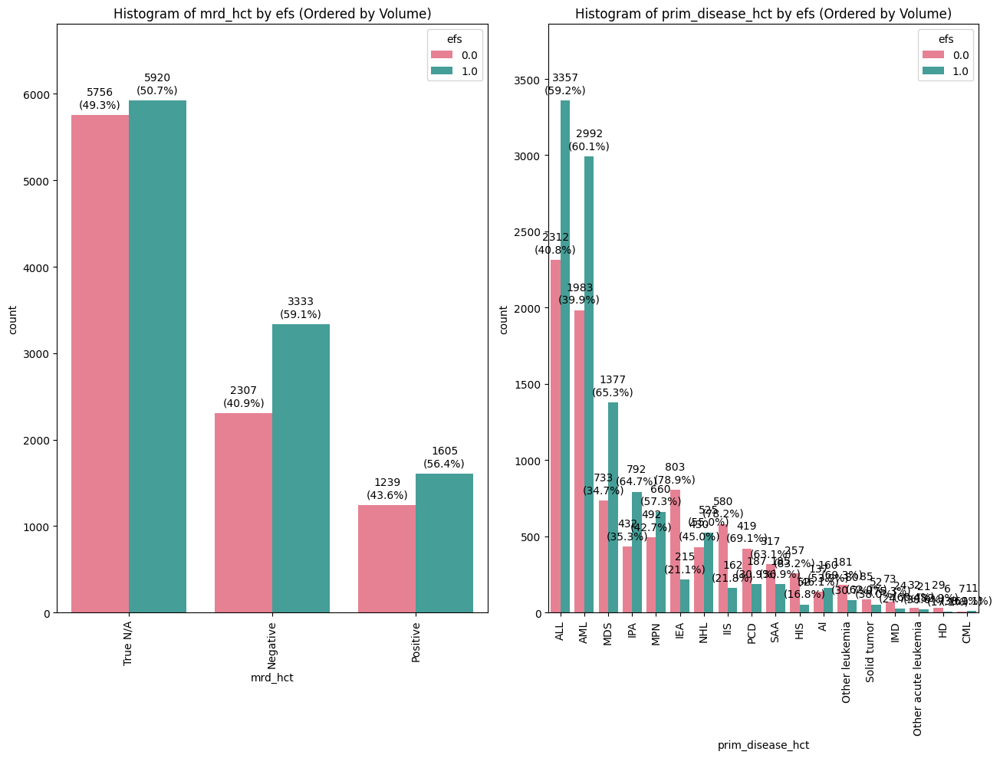

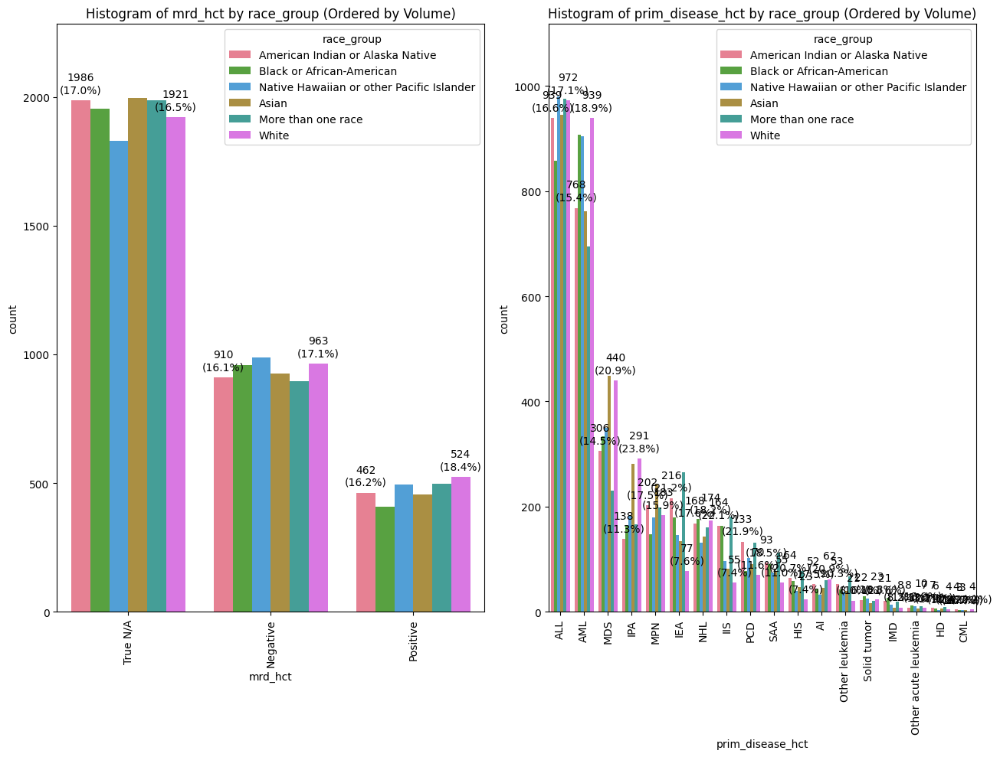

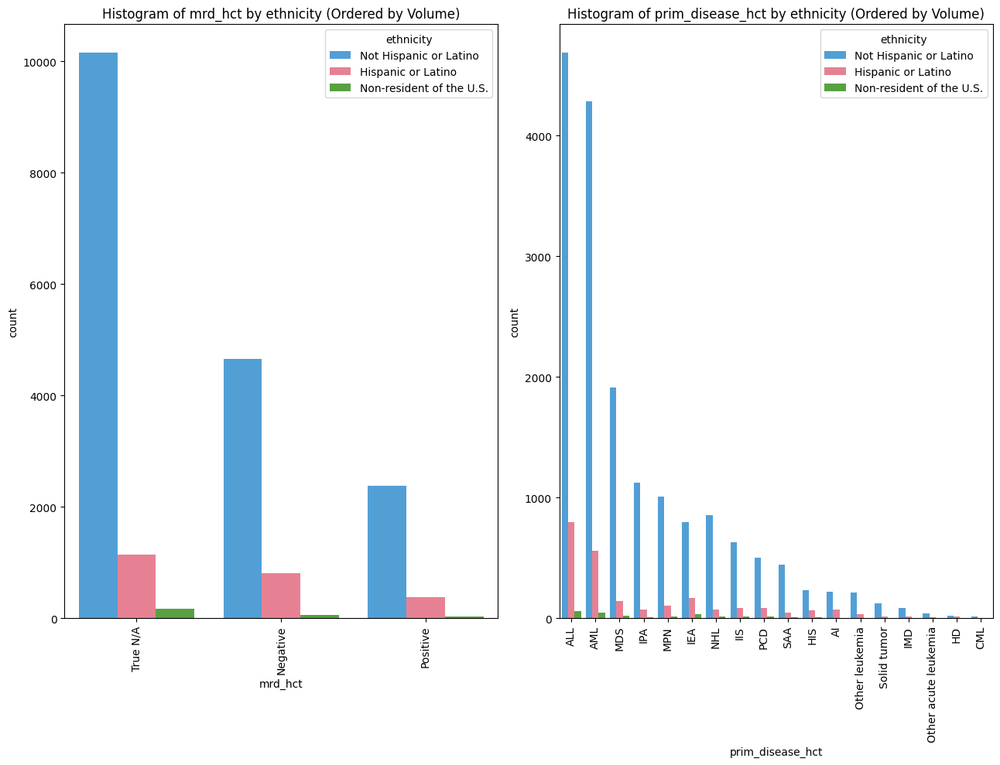

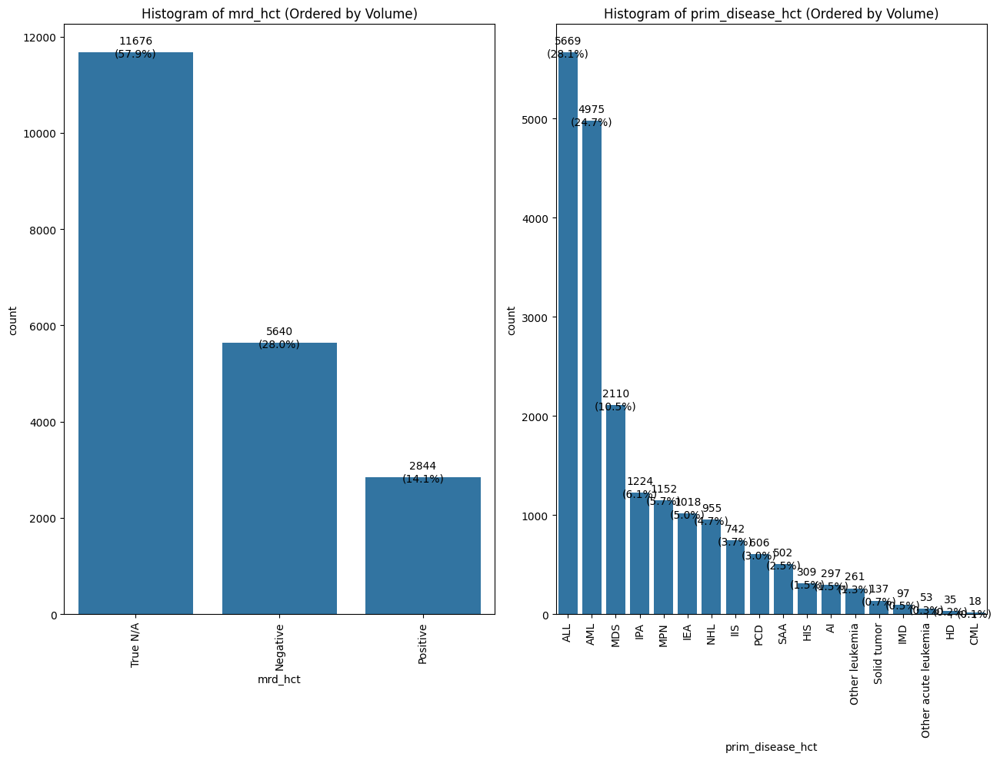

In [61]:
category = "disease_specific"
data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = -10,
        show_values = True
        )

# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7,
        group_column = "race_group",
        na_replacement_continuous = -10,
        show_values = True
        )

# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7,
        group_column = "ethnicity",
        na_replacement_continuous = -10,
        show_values = True
        )

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category],
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7
        )

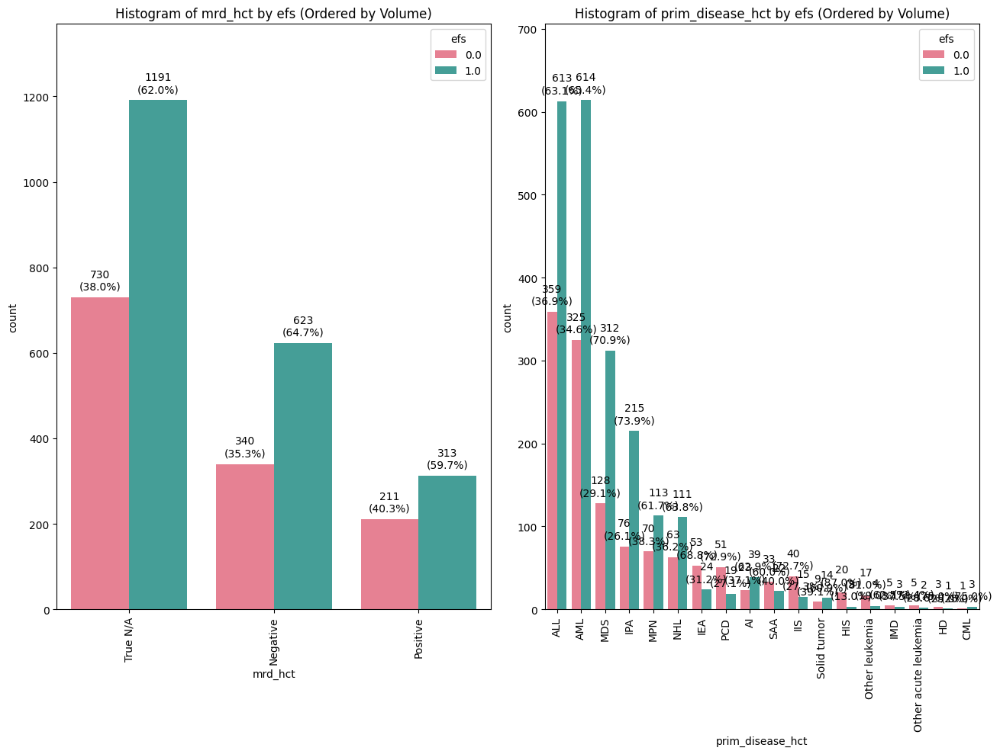

In [62]:
# Visualise how features cooccur with positive EFS in just-white populace


# Plot features against target variable
just_white = data_manipulator.datasets["train"][data_manipulator.datasets["train"]["race_group"]=="White"]

data_manipulator.data_vis.plot_grid(
        data = just_white, 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = -10,
        show_values = True
        )

## GVHD


- tce_div_match
    - Most categories have roughly even split in terms of positive/negative EFS
    - Bi-directional non-permissive was the worst cooccurrence, and has a roughly even racial split
        - Trend is reversed when looking at just white racial group but this still might be useful
          
- tce_imm_match
    - All large categories have some degree of cooccurence with positive EFS, H/H has negative coocurrence and a stronger Asian/Mixed showing, but it is a small subcategory
        - H/H negative cooccurrence disappears when filtered to just white
 
- tce_match
    - Permissive has the best cooccurrence with positive EFS, and a particularly strong white showing
    - Over 60% of data missing, perhaps just create a boolean for "confirmed permissive"
    - Pattern consistent for white-only race group

**Insights:**
- Create tce_div_match boolean for Bi-directional non-permissive
- Try including tce_imm_match and see if it helps but test removal
- Create tce_match boolean for "confirmed permissive"

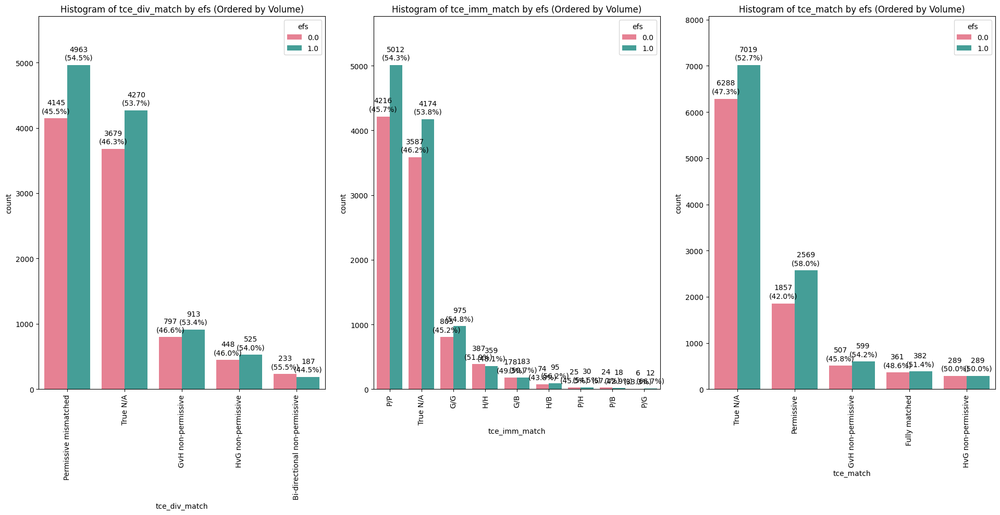

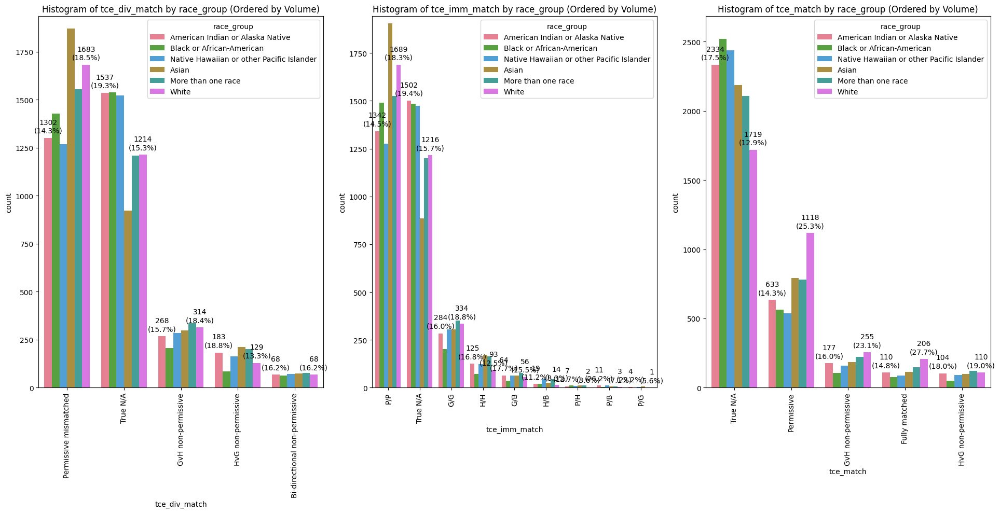

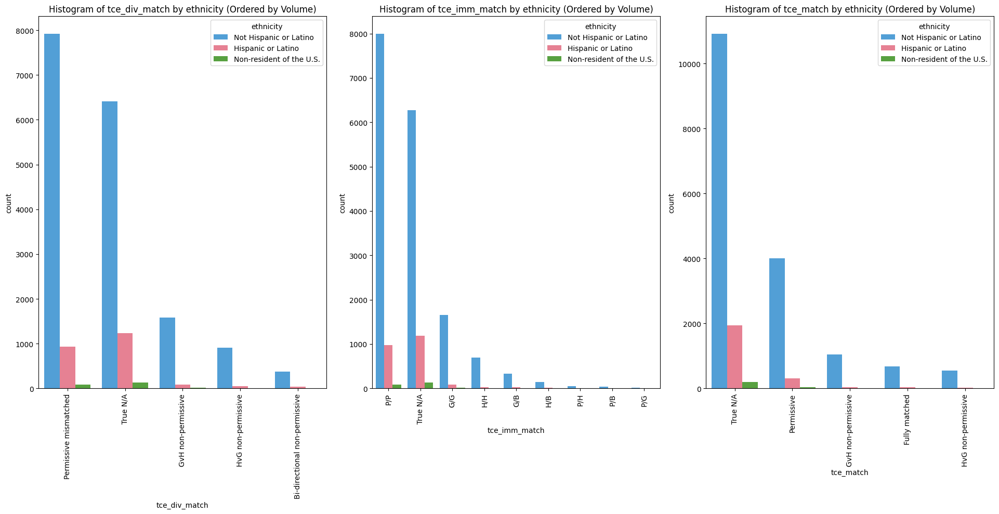

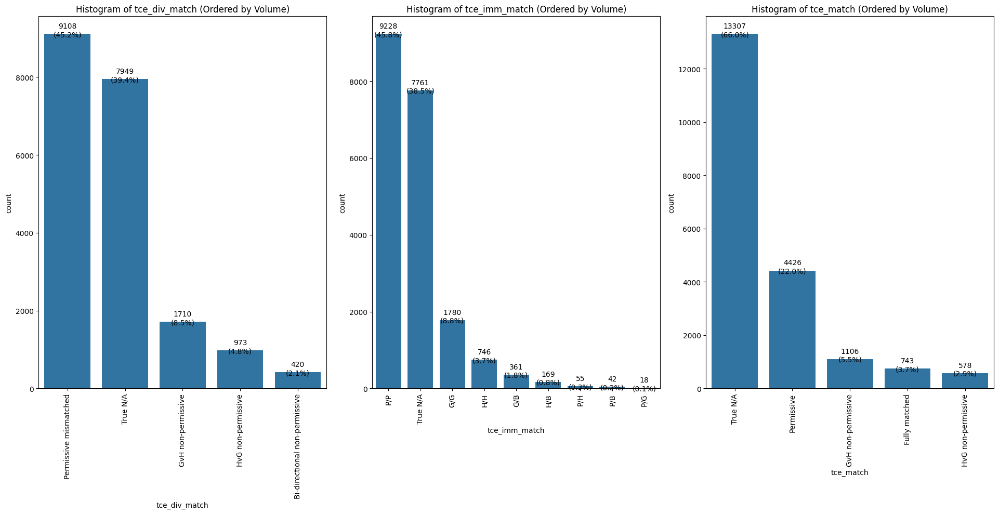

In [41]:
category = "GVHD"
data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = -10,
        show_values = True
        )


# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7,
        group_column = "race_group",
        na_replacement_continuous = -10,
        show_values = True
        )

# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7,
        group_column = "ethnicity",
        na_replacement_continuous = -10,
        show_values = True
        )

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category],
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7
        )

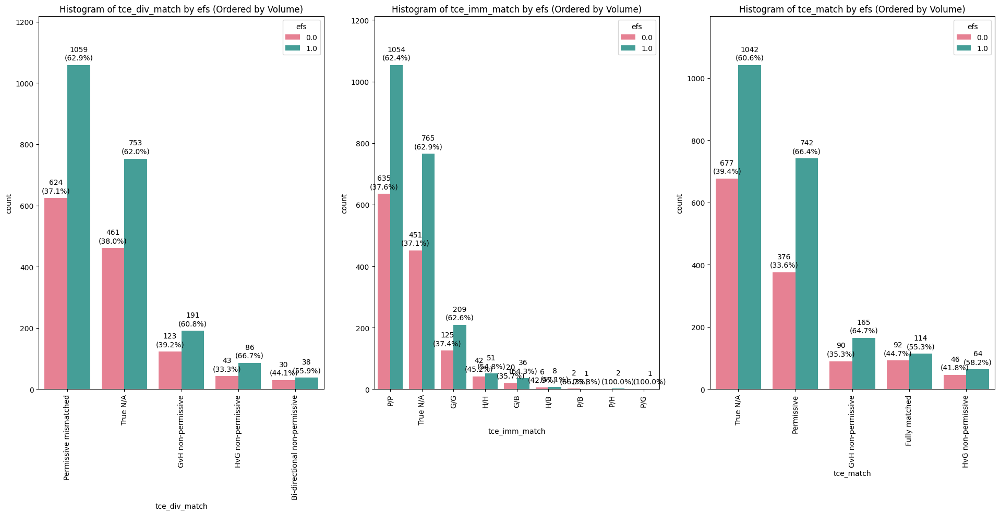

In [42]:
# Visualise how features cooccur with positive EFS in just-white populace


# Plot features against target variable
just_white = data_manipulator.datasets["train"][data_manipulator.datasets["train"]["race_group"]=="White"]

data_manipulator.data_vis.plot_grid(
        data = just_white, 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = categories[category], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (45, 10), 
        n_cols = 7,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = -10,
        show_values = True
        )

# Data cleaning & Feature Engineering


mrd_hct might be one of the simpler features given there is less racial bias and looks like some predictive power
prim_disease_hct may require some rebalancing

- Remove
    - cyto_score_detail
    - prod_type
    - liver_condition_mild_severe

 - Consider removing (test predictive values in simple model/ in combination with others and then remove)
     - psych_disturb
     - rheum_issue
     - obesity
     - prior_tumor
     - hepatic_mild 

       
 -  Adjust

     - [X] Restructure sex colummn to give us
         - [X] Sex of recipient
         - [X] Sex of donor
         - [X] Boolean for sex match
    - [X] Bucket age
        - [ ] Separate boolean for "age is 0"
    - [ ] Buckete donor age
        - [ ] < 40
        - [ ] Missing

     - Convert donor_age to boolean for >40 and separate boolean for age missing
         - Remove donor_age original
     - Extract boolean for cyto_score is na
         - Remove cyto_score
     - Boolean for diabetes check not done
         - Remove diabetes
     - vent_hist
         - fillna with True
     - arrythmia
         - create "confirmed_no" boolean
     - cardiac
         - create "confirmed_no" boolean  
    - pulm_moderate
         - create "confirmed_no" boolean
    - pulm_severe
         - create "confirmed_no" boolean
    - renal_issue
         - create "confirmed_no" boolean
     - hepatic_severe
         - create boolean with "confirmed Yes", all negative and missing just lumped into 0
     - in_vivo
         - create "confirmed_no" boolean
       
     - mrd_hct
         - create boolean with "confirmed negative" all positive and missing just lumped into 0
     - 
     - rituximab
         - Reduce to just "confirmed negative"
     - hla_, dbq, drb columns
         - coalesce low res into high res and drop low-res
     - Keep gvhd_proph but resample
    - Remove melphalan_dosse
    - Keep rituximab but reduce to just "confirmed negative"

- prim_disease_hct
    - ALL, AML, MDS, IPA cooccur with positive EFS
        - AML has particularly strong black, native, and white showing
    - IEA, IIS, PCD cooccur with negative EFS
        - Have particularly strong mixed-race, native, and black showing

tce_div_match
    - Most categories have roughly even split in terms of positive/negative EFS
    - Bi-directional non-permissive


- Create tce_div_match boolean for Bi-directional non-permissive
- Try including tce_imm_match and see if it helps but test removal
- Create tce_match boolean for "confirmed permissive"


- Handle null values
    - Once feature number is reduced - plan functions to handle missing values


**We will keep the following categories initially to see if upweighting incorrect prediction cost helps, if not, consider removing:**
- race_group
- ethnicity

## Restructure sex column

In [43]:
sex_cols = ["donor_sex", "recipient_sex"]

if "sex_match" in data_manipulator.datasets["train"].columns:
    data_manipulator.flexibly_apply_function(
        target_function = split_column,
        target_col = "sex_match",
        split_symbol = "-",
        output_columns = ["donor_sex", "recipient_sex"], 
    )
    
    data_manipulator.flexibly_apply_function(
        target_function = check_identical_values,
        target_cols = sex_cols,
        output_column = "donor_sex_match", 
    )

donor_sex_match - 0


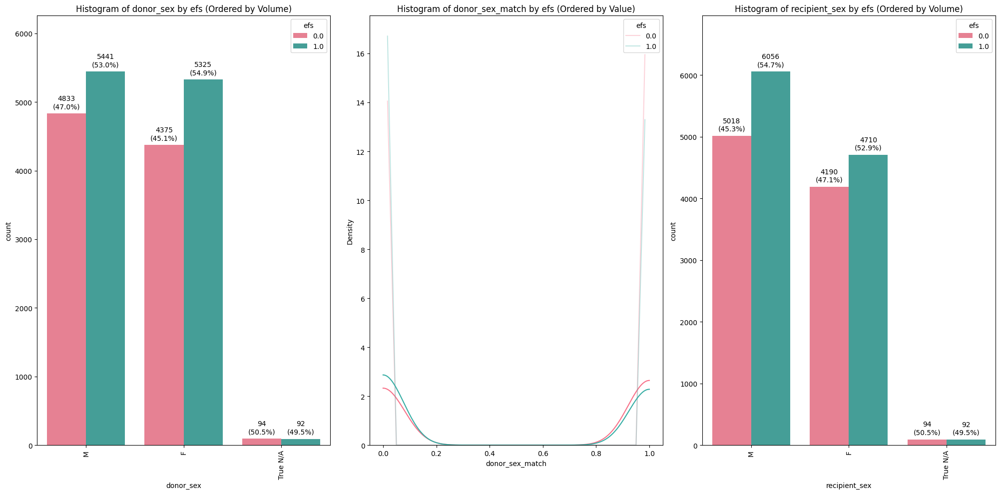

donor_sex_match - 0


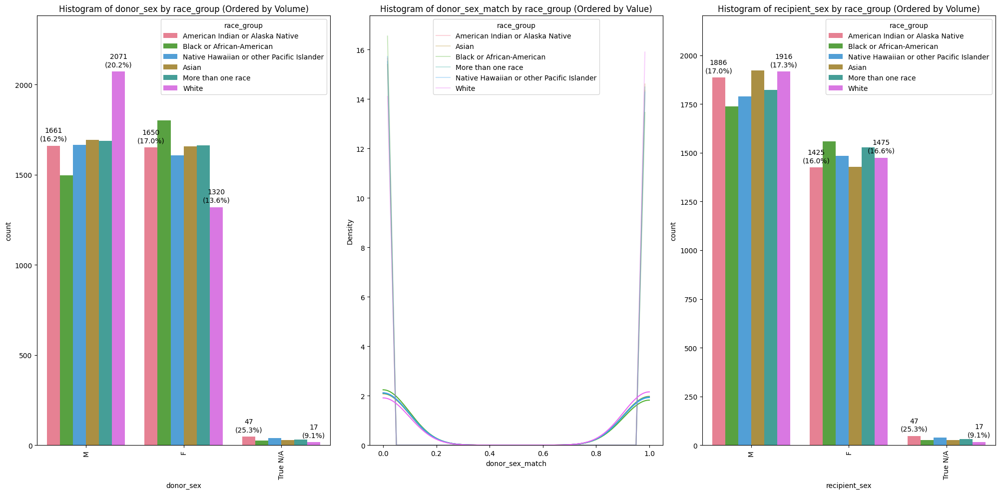

In [44]:
# Visualise new column data

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = ["donor_sex", "recipient_sex", "donor_sex_match"], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (120, 10), 
        n_cols = 18,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = np.nan,
        show_values = True
        )


# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = ["donor_sex", "recipient_sex", "donor_sex_match"], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (120, 10), 
        n_cols = 18,
        group_column = "race_group",
        na_replacement_continuous = np.nan,
        show_values = True
        )

## Bucket age

In [45]:
age_buckets = generate_buckets(
    data = data_manipulator.datasets["train"],
    target_col = "age_at_hct",
    bucket_size = 20
    )

data_manipulator.flexibly_apply_function(
    target_function = bucket_column,
    target_col = "age_at_hct",
    output_name = "bucketed_age", 
    bins = age_buckets,
    threshold_to_take = "upper",
    replacement_for_outer_infinite = 100
)

/tmp/ipykernel_24/847204016.py:107: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  category_group_counts = working_data.groupby([column, group_column]).size().unstack(fill_value=0)


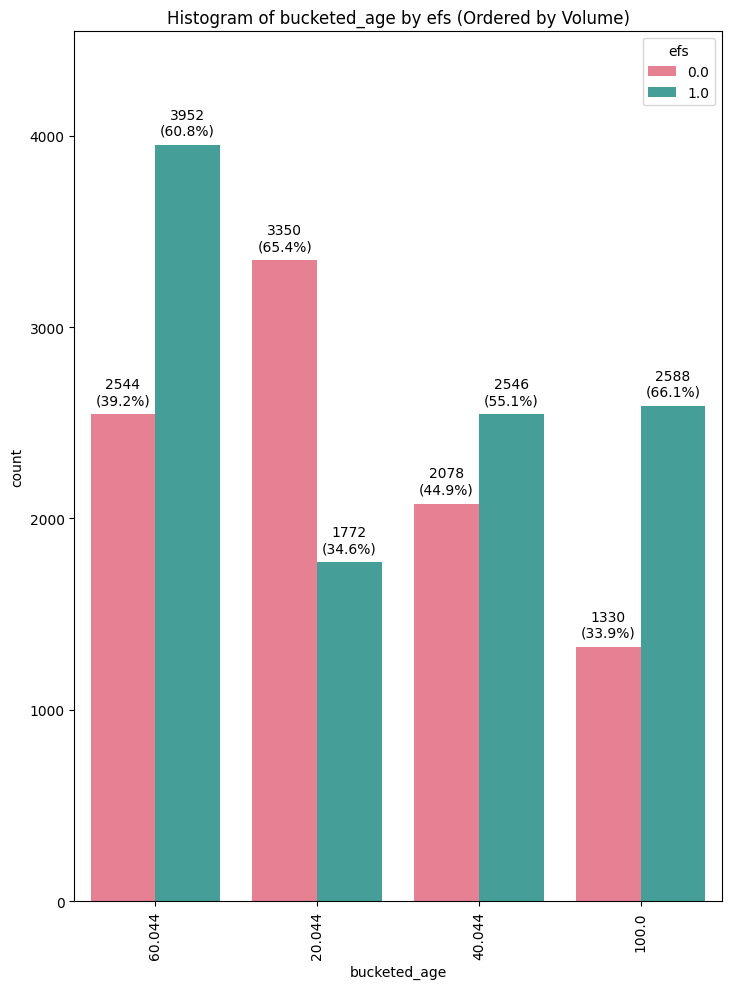

/tmp/ipykernel_24/847204016.py:107: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  category_group_counts = working_data.groupby([column, group_column]).size().unstack(fill_value=0)


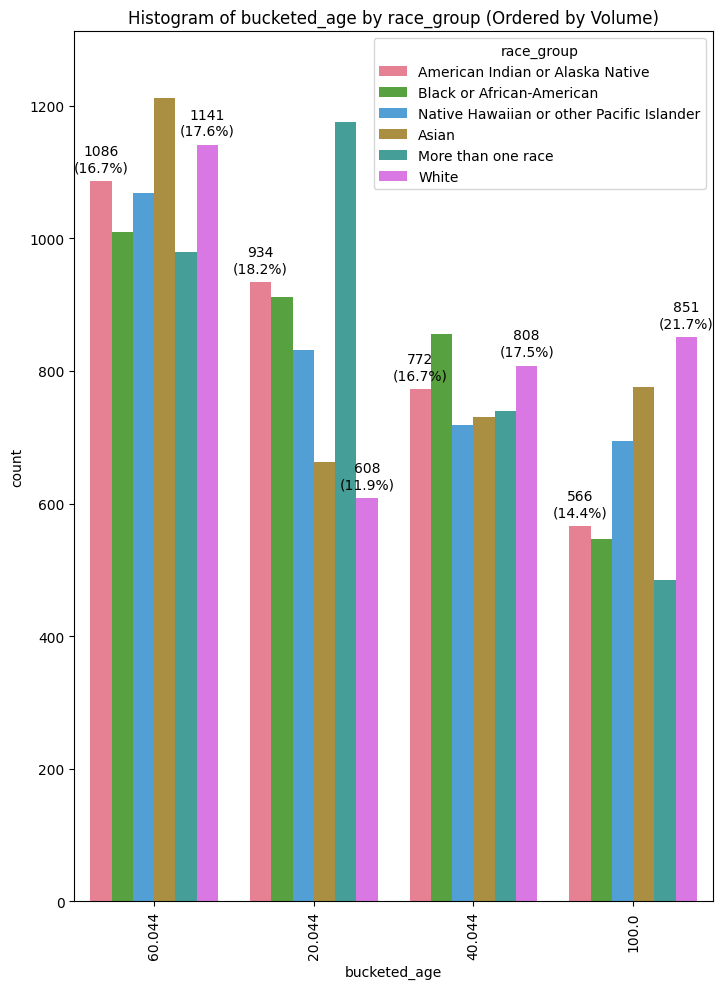

In [46]:
# Visualise new column data

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = ["bucketed_age"], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (120, 10), 
        n_cols = 18,
        group_column = data_manipulator.data_labels.target_col,
        na_replacement_continuous = np.nan,
        show_values = True
        )


# Plot features against known potential confounding variables

data_manipulator.data_vis.plot_grid(
        data = data_manipulator.datasets["train"], 
        plotting_function = data_manipulator.data_vis.plot_distribution,
        columns = ["bucketed_age"], 
        columns_to_skip = list(data_manipulator.data_labels.unique_cols) + list([data_manipulator.data_labels.target_col]),
        figsize = (120, 10), 
        n_cols = 18,
        group_column = "race_group",
        na_replacement_continuous = np.nan,
        show_values = True
        )

In [47]:
data_manipulator.flexibly_apply_function(
    target_function = bucket_column,
    target_col = "age_at_hct",
    output_name = "bucketed_age", 
    bucket_size = 0.5
)

TypeError: bucket_column() got an unexpected keyword argument 'bucket_size'

## Data reweighting

- Resample data to balance out bone marrow transplants across racial groups
- Resample data to balance out RIC conditioning across racial groups
- Resamble data to balance out "FK + MMF +- others" as well as "FK + MTX +-others (not MFF)"

- Resample cytogenic score to balance out non-missing, non "poor" data across racial groups
- ditto dri_score
- ditto conditioning_intensity and in_vivo
- ditto prim_disease_hct
- ditto tce_imm_match, tce_match

**If we can't effectively reweight the data - we run the risk of the model learning racial groups by proxy where certain data is missing, and we need to do one of:**
1. Reduce the resolution of those features so that, for example, instead of being "yes", "no", "missing" it is something like "confirmed no", which could retain the predictive power of confirming something is not the case while reducing the impact of the biased measurement collection
2. Include the race category but adjust the cost function so that it is more costly to under-estimate the survivability of those races
3. Train separate models for different racial groups
4. Remove the features with strong patterns in missing data for certain races/ features where the models may be learning race-by-proxy

## Final data prep for models

- [ ] One-hot encode categorical columns
    - [ ] recipient_sex
    - [ ] donor_sex_match
    - [ ] bucketed_age
        
- [ ] Remove unneeded columns
    - [ ] donor_sex
    - [ ] age_at_hct
    - [ ] prod_type
    - [ ] cyto_score_detail
    - [ ] melphalan_dose
    - [ ] 'hla_match_c_low'
    - [ ] 'hla_match_drb1_low'
    - [ ] 'hla_match_dqb1_low'
    - [ ] 'hla_match_a_low'
    - [ ] 'hla_match_b_low'
    - [ ] hla_high_res_6'
    - [ ] 'hla_high_res_8'
    - [ ] 'hla_high_res_10'
     

# Model testing

- [ ] Establish feature weighting

- [ ] Test models
    - [ ] XGBoost
    - [ ] LightGBM
    - [ ] Random Forest

- [ ] Test feature switching
    - [ ] K-fold cross-validation with features removed

In [ ]:
# Model testing